# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

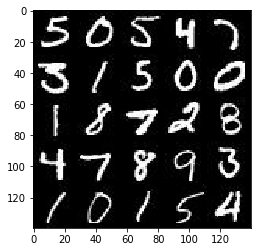

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

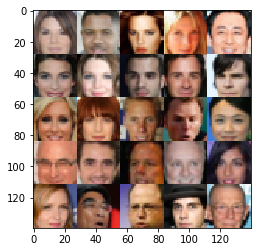

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_images_input = tf.placeholder(dtype=tf.float32, shape=(None, image_width, image_height, image_channels), name='real_images')

    # Keep Z dim in mind, might need to come back and fix it.
    z_input = tf.placeholder(dtype=tf.float32, shape=(None, z_dim), name='z_input')
    learning_rate = tf.placeholder(dtype=tf.float32, name='learning_rate')
    return real_images_input, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/lib/python3.5/runpy.py", line 184, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.5/dist-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/usr/lo

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def leakyReLU(alpha, input_tensor):
    return tf.maximum(alpha*input_tensor, input_tensor)
    

def discriminator(images, reuse=False, alpha = 0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse) as scope:
    
        c1 = tf.layers.conv2d(inputs=images, filters=64, kernel_size=(5,5), strides=(2,2), padding='same', \
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        lr_c1 = leakyReLU(alpha, c1)
        
        c2 = tf.layers.conv2d(inputs=lr_c1, filters=128, kernel_size=(5,5), strides=(2,2), padding='same', \
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        bc2 = tf.layers.batch_normalization(c2, training=True)
        lr_c2 = leakyReLU(alpha, bc2)
        
        c3 = tf.layers.conv2d(inputs=lr_c2, filters=256, kernel_size=(5,5), strides=(2,2), padding='same', \
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        bc3 = tf.layers.batch_normalization(c3, training=True)
        lr_c3 = leakyReLU(alpha, bc3)
        
        c4 = tf.layers.conv2d(inputs=lr_c3, filters=512, kernel_size=(5,5), strides=(2,2), padding='same', \
                             kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        bc4 = tf.layers.batch_normalization(c4, training=True)
        lr_c4 = leakyReLU(alpha, bc4)
        
        # Flatten the channels.
        flatten = tf.contrib.layers.flatten(lr_c4)
        logits = tf.layers.dense(flatten, 1)
        output = tf.nn.sigmoid(logits)

#         print('Conv1 Shape', lr_c1.get_shape())
#         print('Conv2 Shape', lr_c2.get_shape())
#         print('Conv3 Shape', lr_c3.get_shape())
#         print('Conv4 Shape', lr_c4.get_shape())
#         print('Output', output.get_shape())
#         print('----------------------------------')
        
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # For training, create variables the first time.
    # When generating images, is_train=False, reuse variables.
    with tf.variable_scope('generator', reuse=not(is_train)):
    
        fc = tf.layers.dense(inputs=z, units=7*7*1024, activation=None)
        fc_reshape = tf.reshape(fc, (-1,7,7,1024))
        bfc = tf.layers.batch_normalization(fc_reshape)
        lr_fc = leakyReLU(alpha, bfc)
        
        c1 = tf.layers.conv2d_transpose(inputs=lr_fc, filters=512, kernel_size=(5,5), strides=(1,1), padding='same')
        bc1 = tf.layers.batch_normalization(c1, training=is_train)
        lr_cv1 = leakyReLU(alpha, bc1)
        
        c2 = tf.layers.conv2d_transpose(inputs=lr_cv1, filters=256, kernel_size=(5,5), strides=(2,2), padding='same')
        bc2 = tf.layers.batch_normalization(c2, training=is_train)
        lr_cv2 = leakyReLU(alpha, bc2)
        
        c3 = tf.layers.conv2d_transpose(inputs=lr_cv2, filters=128, kernel_size=(5,5), strides=(1,1), padding='same')
        bc3 = tf.layers.batch_normalization(c3, training=is_train)
        lr_cv3 = leakyReLU(alpha, bc3)
        
        c4 = tf.layers.conv2d_transpose(inputs=lr_cv3, filters=64, kernel_size=(5,5), strides=(2,2), padding='same')
        bc4 = tf.layers.batch_normalization(c4, training=is_train)
        lr_cv4 = leakyReLU(alpha, bc4)

        logits = tf.layers.conv2d_transpose(inputs=lr_cv4, filters=out_channel_dim, kernel_size=(5,5), strides=(1,1), padding='same')
        output = tf.nn.tanh(logits)

#         print('FC Shape', lr_fc.get_shape())
#         print('Conv1 Shape', lr_cv1.get_shape())
#         print('Conv2 Shape', lr_cv2.get_shape())
#         print('Conv3 Shape', lr_cv3.get_shape())
#         print('Conv4 Shape', lr_cv4.get_shape())
#         print('Output', output.get_shape())
#         print('----------------------------------')
        
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    output_fake_image = generator(input_z, out_channel_dim, is_train=True)
    
    output_real, logits_real = discriminator(input_real, reuse=False)
    output_fake, logits_fake = discriminator(output_fake_image, reuse=True)
    
    loss_dis_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_real, labels=tf.ones_like(logits_real)*0.9))
    loss_dis_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=tf.zeros_like(logits_real)))
    loss_dis = loss_dis_fake + loss_dis_real
    
    loss_gen = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(logits_real), logits=logits_fake))
    
    return loss_dis, loss_gen


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    trainable_variables = tf.trainable_variables()
    generator_variables = [variable for variable in trainable_variables if variable.name.startswith('generator')]    
    discriminator_variables = [variable for variable in trainable_variables if variable.name.startswith('discriminator')]
    
    # Handle batch normalization variables.
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        train_generator = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=generator_variables)
        train_discriminator = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=discriminator_variables)
    return train_discriminator, train_generator


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """

    data_size, image_width, image_height, image_channels = data_shape
    real_images_input, z_input, learning_rate_input = model_inputs(image_width, image_height, image_channels, z_dim)
    loss_dis, loss_gen = model_loss(real_images_input, z_input, image_channels)
    train_discriminator, train_generator = model_opt(loss_dis, loss_gen, learning_rate, beta1)
    
    samples = []
    losses = []
    run_epochs = 0

    show_e = 100
    print_e = 10
    n_images = 25
    
    with tf.Session() as sess:
        # Initialize variables.
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count+1):
            for batch_images in get_batches(batch_size):
                
                batch_images = batch_images * 2
                z_batch = np.random.uniform(low=-1,high=1, size=(batch_size, z_dim))
                
                # Run gradient descent.
                _ = sess.run(train_discriminator, 
                             feed_dict={z_input:z_batch, real_images_input:batch_images, \
                                        learning_rate_input: learning_rate})
                _ = sess.run(train_generator, 
                             feed_dict={z_input:z_batch, real_images_input:batch_images, learning_rate_input: learning_rate})
                
                # Show losses every 'print_e' iterations.
                if (run_epochs%print_e==0):
                    epoch_loss_dis = sess.run(loss_dis, feed_dict={z_input:z_batch, real_images_input:batch_images})
                    epoch_loss_gen = sess.run(loss_gen, feed_dict={z_input:z_batch, real_images_input:batch_images})
                    losses.append((epoch_loss_dis, epoch_loss_gen))
                    print('Epochs: %s/%s. Discriminator Loss: %s Generator Loss: %s' % (epoch_i, epoch_count,
                                                                                        np.round(epoch_loss_dis,3), 
                                                                                        np.round(epoch_loss_gen,3)))
                # Show generated images every 'show_e' iterations.
                if (run_epochs%show_e==0):
                    show_generator_output(sess, n_images, z_input, image_channels, data_image_mode)
                run_epochs+=1
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epochs: 0/2. Discriminator Loss: 23.155 Generator Loss: 0.0


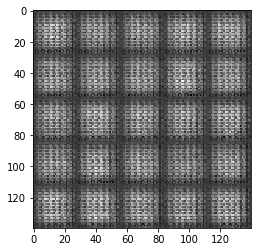

Epochs: 0/2. Discriminator Loss: 0.999 Generator Loss: 1.764
Epochs: 0/2. Discriminator Loss: 0.859 Generator Loss: 2.525
Epochs: 0/2. Discriminator Loss: 1.227 Generator Loss: 1.303
Epochs: 0/2. Discriminator Loss: 1.198 Generator Loss: 1.167
Epochs: 0/2. Discriminator Loss: 1.85 Generator Loss: 0.305
Epochs: 0/2. Discriminator Loss: 1.694 Generator Loss: 0.567
Epochs: 0/2. Discriminator Loss: 1.298 Generator Loss: 0.894
Epochs: 0/2. Discriminator Loss: 1.453 Generator Loss: 0.722
Epochs: 0/2. Discriminator Loss: 1.581 Generator Loss: 0.503
Epochs: 0/2. Discriminator Loss: 1.788 Generator Loss: 0.355


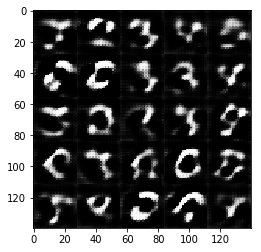

Epochs: 0/2. Discriminator Loss: 1.877 Generator Loss: 2.384
Epochs: 0/2. Discriminator Loss: 1.042 Generator Loss: 1.03
Epochs: 0/2. Discriminator Loss: 1.406 Generator Loss: 0.523
Epochs: 0/2. Discriminator Loss: 1.139 Generator Loss: 0.882
Epochs: 0/2. Discriminator Loss: 1.134 Generator Loss: 0.73
Epochs: 0/2. Discriminator Loss: 1.44 Generator Loss: 0.876
Epochs: 0/2. Discriminator Loss: 1.938 Generator Loss: 1.404
Epochs: 0/2. Discriminator Loss: 1.114 Generator Loss: 0.795
Epochs: 0/2. Discriminator Loss: 1.08 Generator Loss: 1.594
Epochs: 0/2. Discriminator Loss: 1.515 Generator Loss: 1.659


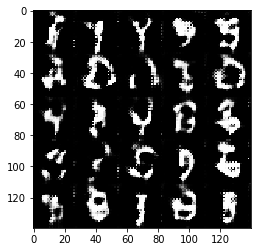

Epochs: 0/2. Discriminator Loss: 1.003 Generator Loss: 1.077
Epochs: 0/2. Discriminator Loss: 1.438 Generator Loss: 0.839
Epochs: 0/2. Discriminator Loss: 1.375 Generator Loss: 0.891
Epochs: 0/2. Discriminator Loss: 1.413 Generator Loss: 0.592
Epochs: 0/2. Discriminator Loss: 1.233 Generator Loss: 0.889
Epochs: 0/2. Discriminator Loss: 0.979 Generator Loss: 1.397
Epochs: 0/2. Discriminator Loss: 2.314 Generator Loss: 0.225
Epochs: 0/2. Discriminator Loss: 1.428 Generator Loss: 1.129
Epochs: 0/2. Discriminator Loss: 1.53 Generator Loss: 0.528
Epochs: 0/2. Discriminator Loss: 1.579 Generator Loss: 0.481


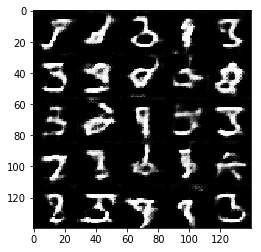

Epochs: 0/2. Discriminator Loss: 1.511 Generator Loss: 0.686
Epochs: 0/2. Discriminator Loss: 1.239 Generator Loss: 0.883
Epochs: 0/2. Discriminator Loss: 1.25 Generator Loss: 0.803
Epochs: 0/2. Discriminator Loss: 1.502 Generator Loss: 0.728
Epochs: 0/2. Discriminator Loss: 1.464 Generator Loss: 0.511
Epochs: 0/2. Discriminator Loss: 1.296 Generator Loss: 0.687
Epochs: 0/2. Discriminator Loss: 1.407 Generator Loss: 1.329
Epochs: 0/2. Discriminator Loss: 1.724 Generator Loss: 0.791
Epochs: 0/2. Discriminator Loss: 1.336 Generator Loss: 0.569
Epochs: 0/2. Discriminator Loss: 1.171 Generator Loss: 0.816


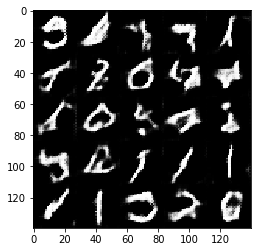

Epochs: 0/2. Discriminator Loss: 1.477 Generator Loss: 0.598
Epochs: 0/2. Discriminator Loss: 1.344 Generator Loss: 0.545
Epochs: 0/2. Discriminator Loss: 1.304 Generator Loss: 0.649
Epochs: 0/2. Discriminator Loss: 1.228 Generator Loss: 0.755
Epochs: 0/2. Discriminator Loss: 1.124 Generator Loss: 0.838
Epochs: 0/2. Discriminator Loss: 1.6 Generator Loss: 0.368
Epochs: 0/2. Discriminator Loss: 1.18 Generator Loss: 0.74
Epochs: 0/2. Discriminator Loss: 1.264 Generator Loss: 0.861
Epochs: 0/2. Discriminator Loss: 1.405 Generator Loss: 0.552
Epochs: 0/2. Discriminator Loss: 1.598 Generator Loss: 0.379


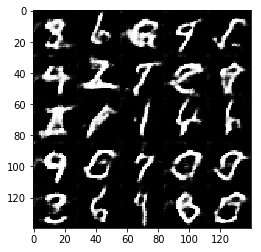

Epochs: 0/2. Discriminator Loss: 1.15 Generator Loss: 0.937
Epochs: 0/2. Discriminator Loss: 1.311 Generator Loss: 0.65
Epochs: 0/2. Discriminator Loss: 1.157 Generator Loss: 0.809
Epochs: 0/2. Discriminator Loss: 1.147 Generator Loss: 1.242
Epochs: 0/2. Discriminator Loss: 1.159 Generator Loss: 0.956
Epochs: 0/2. Discriminator Loss: 1.152 Generator Loss: 0.805
Epochs: 0/2. Discriminator Loss: 1.398 Generator Loss: 1.079
Epochs: 0/2. Discriminator Loss: 1.394 Generator Loss: 0.536
Epochs: 0/2. Discriminator Loss: 1.141 Generator Loss: 0.786
Epochs: 0/2. Discriminator Loss: 1.04 Generator Loss: 1.021


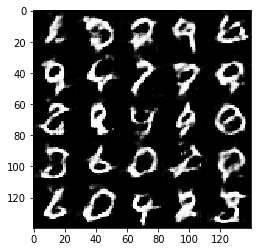

Epochs: 0/2. Discriminator Loss: 1.163 Generator Loss: 0.825
Epochs: 0/2. Discriminator Loss: 1.258 Generator Loss: 0.692
Epochs: 0/2. Discriminator Loss: 1.274 Generator Loss: 0.706
Epochs: 0/2. Discriminator Loss: 1.174 Generator Loss: 0.843
Epochs: 0/2. Discriminator Loss: 1.268 Generator Loss: 0.632
Epochs: 0/2. Discriminator Loss: 1.293 Generator Loss: 0.589
Epochs: 0/2. Discriminator Loss: 1.319 Generator Loss: 0.621
Epochs: 0/2. Discriminator Loss: 0.967 Generator Loss: 1.094
Epochs: 0/2. Discriminator Loss: 0.916 Generator Loss: 1.133
Epochs: 0/2. Discriminator Loss: 1.18 Generator Loss: 0.788


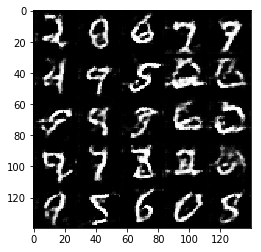

Epochs: 0/2. Discriminator Loss: 1.179 Generator Loss: 0.73
Epochs: 0/2. Discriminator Loss: 1.168 Generator Loss: 0.68
Epochs: 0/2. Discriminator Loss: 1.461 Generator Loss: 0.811
Epochs: 0/2. Discriminator Loss: 1.768 Generator Loss: 0.401
Epochs: 0/2. Discriminator Loss: 0.914 Generator Loss: 1.01
Epochs: 0/2. Discriminator Loss: 1.818 Generator Loss: 0.318
Epochs: 0/2. Discriminator Loss: 1.246 Generator Loss: 0.65
Epochs: 0/2. Discriminator Loss: 1.218 Generator Loss: 1.627
Epochs: 0/2. Discriminator Loss: 1.271 Generator Loss: 0.832
Epochs: 0/2. Discriminator Loss: 1.475 Generator Loss: 0.763


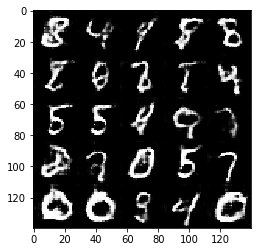

Epochs: 0/2. Discriminator Loss: 1.12 Generator Loss: 0.878
Epochs: 0/2. Discriminator Loss: 1.297 Generator Loss: 0.591
Epochs: 0/2. Discriminator Loss: 1.43 Generator Loss: 0.531
Epochs: 0/2. Discriminator Loss: 1.035 Generator Loss: 0.969
Epochs: 0/2. Discriminator Loss: 1.073 Generator Loss: 0.853
Epochs: 0/2. Discriminator Loss: 1.374 Generator Loss: 0.639
Epochs: 0/2. Discriminator Loss: 1.489 Generator Loss: 0.458
Epochs: 0/2. Discriminator Loss: 1.383 Generator Loss: 0.504
Epochs: 0/2. Discriminator Loss: 1.782 Generator Loss: 0.401
Epochs: 0/2. Discriminator Loss: 1.191 Generator Loss: 0.816


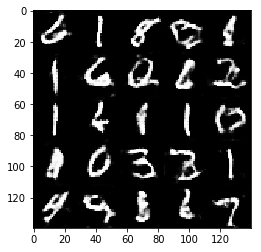

Epochs: 0/2. Discriminator Loss: 1.04 Generator Loss: 0.779
Epochs: 0/2. Discriminator Loss: 1.037 Generator Loss: 1.273
Epochs: 0/2. Discriminator Loss: 1.064 Generator Loss: 1.57
Epochs: 0/2. Discriminator Loss: 1.39 Generator Loss: 0.505
Epochs: 0/2. Discriminator Loss: 1.019 Generator Loss: 0.961
Epochs: 0/2. Discriminator Loss: 1.243 Generator Loss: 0.644
Epochs: 0/2. Discriminator Loss: 1.142 Generator Loss: 1.001
Epochs: 0/2. Discriminator Loss: 1.17 Generator Loss: 0.799
Epochs: 0/2. Discriminator Loss: 1.244 Generator Loss: 0.939
Epochs: 0/2. Discriminator Loss: 1.122 Generator Loss: 0.807


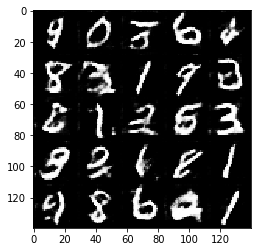

Epochs: 0/2. Discriminator Loss: 1.44 Generator Loss: 0.501
Epochs: 0/2. Discriminator Loss: 1.358 Generator Loss: 0.57
Epochs: 0/2. Discriminator Loss: 1.23 Generator Loss: 0.649
Epochs: 0/2. Discriminator Loss: 1.503 Generator Loss: 0.577
Epochs: 0/2. Discriminator Loss: 1.087 Generator Loss: 1.376
Epochs: 0/2. Discriminator Loss: 1.159 Generator Loss: 0.647
Epochs: 0/2. Discriminator Loss: 1.878 Generator Loss: 0.307
Epochs: 0/2. Discriminator Loss: 1.031 Generator Loss: 0.827
Epochs: 0/2. Discriminator Loss: 1.353 Generator Loss: 0.637
Epochs: 0/2. Discriminator Loss: 1.154 Generator Loss: 0.681


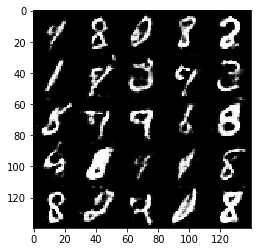

Epochs: 0/2. Discriminator Loss: 0.808 Generator Loss: 1.16
Epochs: 0/2. Discriminator Loss: 1.518 Generator Loss: 1.489
Epochs: 0/2. Discriminator Loss: 1.173 Generator Loss: 0.643
Epochs: 0/2. Discriminator Loss: 1.202 Generator Loss: 0.924
Epochs: 0/2. Discriminator Loss: 1.446 Generator Loss: 0.546
Epochs: 0/2. Discriminator Loss: 0.935 Generator Loss: 0.938
Epochs: 0/2. Discriminator Loss: 1.071 Generator Loss: 1.89
Epochs: 0/2. Discriminator Loss: 1.372 Generator Loss: 0.553
Epochs: 0/2. Discriminator Loss: 1.641 Generator Loss: 0.367
Epochs: 0/2. Discriminator Loss: 1.024 Generator Loss: 0.811


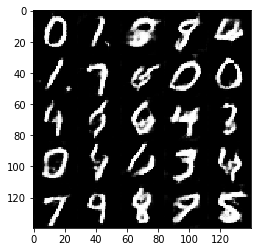

Epochs: 0/2. Discriminator Loss: 0.919 Generator Loss: 1.375
Epochs: 0/2. Discriminator Loss: 1.345 Generator Loss: 1.549
Epochs: 0/2. Discriminator Loss: 1.805 Generator Loss: 1.269
Epochs: 0/2. Discriminator Loss: 0.972 Generator Loss: 1.754
Epochs: 0/2. Discriminator Loss: 1.356 Generator Loss: 1.172
Epochs: 0/2. Discriminator Loss: 1.076 Generator Loss: 0.807
Epochs: 0/2. Discriminator Loss: 0.989 Generator Loss: 0.848
Epochs: 0/2. Discriminator Loss: 1.488 Generator Loss: 0.51
Epochs: 0/2. Discriminator Loss: 1.01 Generator Loss: 1.019
Epochs: 0/2. Discriminator Loss: 0.918 Generator Loss: 0.959


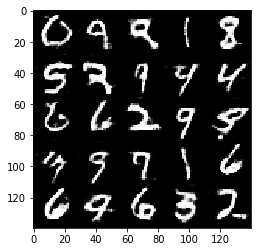

Epochs: 0/2. Discriminator Loss: 1.053 Generator Loss: 0.843
Epochs: 0/2. Discriminator Loss: 0.868 Generator Loss: 1.119
Epochs: 0/2. Discriminator Loss: 0.755 Generator Loss: 1.235
Epochs: 0/2. Discriminator Loss: 1.01 Generator Loss: 0.821
Epochs: 0/2. Discriminator Loss: 1.064 Generator Loss: 0.924
Epochs: 0/2. Discriminator Loss: 1.555 Generator Loss: 0.421
Epochs: 0/2. Discriminator Loss: 1.205 Generator Loss: 0.801
Epochs: 0/2. Discriminator Loss: 1.726 Generator Loss: 0.354
Epochs: 0/2. Discriminator Loss: 1.049 Generator Loss: 1.037
Epochs: 0/2. Discriminator Loss: 0.956 Generator Loss: 0.902


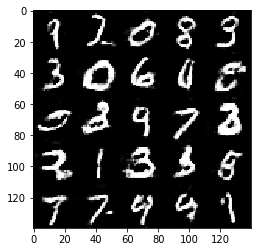

Epochs: 0/2. Discriminator Loss: 1.149 Generator Loss: 0.95
Epochs: 0/2. Discriminator Loss: 0.758 Generator Loss: 1.772
Epochs: 0/2. Discriminator Loss: 1.054 Generator Loss: 1.056
Epochs: 0/2. Discriminator Loss: 0.77 Generator Loss: 1.809
Epochs: 0/2. Discriminator Loss: 1.192 Generator Loss: 0.607
Epochs: 0/2. Discriminator Loss: 1.79 Generator Loss: 0.372
Epochs: 0/2. Discriminator Loss: 1.694 Generator Loss: 0.344
Epochs: 0/2. Discriminator Loss: 1.469 Generator Loss: 0.534
Epochs: 0/2. Discriminator Loss: 1.565 Generator Loss: 0.547
Epochs: 0/2. Discriminator Loss: 0.846 Generator Loss: 1.413


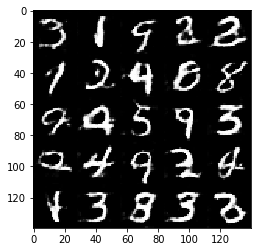

Epochs: 0/2. Discriminator Loss: 1.225 Generator Loss: 0.836
Epochs: 0/2. Discriminator Loss: 1.56 Generator Loss: 0.412
Epochs: 0/2. Discriminator Loss: 1.22 Generator Loss: 0.58
Epochs: 0/2. Discriminator Loss: 1.421 Generator Loss: 0.499
Epochs: 0/2. Discriminator Loss: 2.112 Generator Loss: 0.251
Epochs: 0/2. Discriminator Loss: 0.92 Generator Loss: 1.198
Epochs: 0/2. Discriminator Loss: 1.121 Generator Loss: 0.725
Epochs: 0/2. Discriminator Loss: 1.301 Generator Loss: 0.55
Epochs: 0/2. Discriminator Loss: 1.405 Generator Loss: 0.48
Epochs: 0/2. Discriminator Loss: 1.51 Generator Loss: 0.42


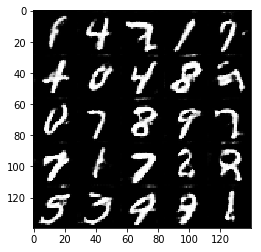

Epochs: 0/2. Discriminator Loss: 1.027 Generator Loss: 1.115
Epochs: 0/2. Discriminator Loss: 1.337 Generator Loss: 0.581
Epochs: 0/2. Discriminator Loss: 1.109 Generator Loss: 0.715
Epochs: 0/2. Discriminator Loss: 1.249 Generator Loss: 0.659
Epochs: 0/2. Discriminator Loss: 1.189 Generator Loss: 0.63
Epochs: 0/2. Discriminator Loss: 1.04 Generator Loss: 0.774
Epochs: 0/2. Discriminator Loss: 1.28 Generator Loss: 0.603
Epochs: 0/2. Discriminator Loss: 1.641 Generator Loss: 0.455
Epochs: 0/2. Discriminator Loss: 1.357 Generator Loss: 0.574
Epochs: 0/2. Discriminator Loss: 1.072 Generator Loss: 0.711


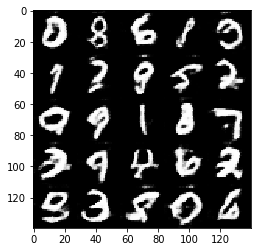

Epochs: 0/2. Discriminator Loss: 1.603 Generator Loss: 0.432
Epochs: 0/2. Discriminator Loss: 1.388 Generator Loss: 0.513
Epochs: 0/2. Discriminator Loss: 2.365 Generator Loss: 0.215
Epochs: 0/2. Discriminator Loss: 1.053 Generator Loss: 0.856
Epochs: 0/2. Discriminator Loss: 0.933 Generator Loss: 1.265
Epochs: 0/2. Discriminator Loss: 0.733 Generator Loss: 1.309
Epochs: 0/2. Discriminator Loss: 2.045 Generator Loss: 0.225
Epochs: 0/2. Discriminator Loss: 1.206 Generator Loss: 0.624
Epochs: 0/2. Discriminator Loss: 2.023 Generator Loss: 0.26
Epochs: 0/2. Discriminator Loss: 1.574 Generator Loss: 0.401


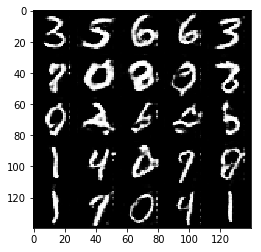

Epochs: 0/2. Discriminator Loss: 1.029 Generator Loss: 1.349
Epochs: 0/2. Discriminator Loss: 1.018 Generator Loss: 0.8
Epochs: 0/2. Discriminator Loss: 0.758 Generator Loss: 1.762
Epochs: 0/2. Discriminator Loss: 1.206 Generator Loss: 0.597
Epochs: 0/2. Discriminator Loss: 1.526 Generator Loss: 0.413
Epochs: 0/2. Discriminator Loss: 1.032 Generator Loss: 0.82
Epochs: 0/2. Discriminator Loss: 0.826 Generator Loss: 1.057
Epochs: 1/2. Discriminator Loss: 2.171 Generator Loss: 0.223
Epochs: 1/2. Discriminator Loss: 2.512 Generator Loss: 0.16
Epochs: 1/2. Discriminator Loss: 1.171 Generator Loss: 0.932


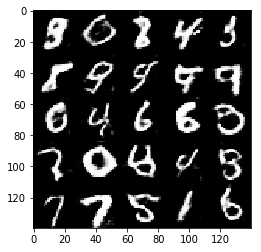

Epochs: 1/2. Discriminator Loss: 0.779 Generator Loss: 1.378
Epochs: 1/2. Discriminator Loss: 0.956 Generator Loss: 1.081
Epochs: 1/2. Discriminator Loss: 1.068 Generator Loss: 0.738
Epochs: 1/2. Discriminator Loss: 1.672 Generator Loss: 0.334
Epochs: 1/2. Discriminator Loss: 1.556 Generator Loss: 0.422
Epochs: 1/2. Discriminator Loss: 1.084 Generator Loss: 1.018
Epochs: 1/2. Discriminator Loss: 1.056 Generator Loss: 0.738
Epochs: 1/2. Discriminator Loss: 0.835 Generator Loss: 2.083
Epochs: 1/2. Discriminator Loss: 1.147 Generator Loss: 0.659
Epochs: 1/2. Discriminator Loss: 1.656 Generator Loss: 0.352


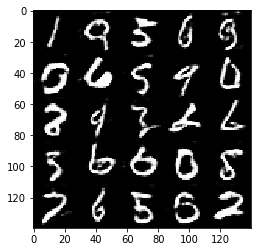

Epochs: 1/2. Discriminator Loss: 1.381 Generator Loss: 0.525
Epochs: 1/2. Discriminator Loss: 1.055 Generator Loss: 0.734
Epochs: 1/2. Discriminator Loss: 1.47 Generator Loss: 0.543
Epochs: 1/2. Discriminator Loss: 1.496 Generator Loss: 0.433
Epochs: 1/2. Discriminator Loss: 0.73 Generator Loss: 1.709
Epochs: 1/2. Discriminator Loss: 1.196 Generator Loss: 0.67
Epochs: 1/2. Discriminator Loss: 1.198 Generator Loss: 0.722
Epochs: 1/2. Discriminator Loss: 1.298 Generator Loss: 0.56
Epochs: 1/2. Discriminator Loss: 1.077 Generator Loss: 0.754
Epochs: 1/2. Discriminator Loss: 0.751 Generator Loss: 1.283


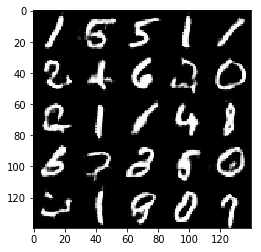

Epochs: 1/2. Discriminator Loss: 1.043 Generator Loss: 0.821
Epochs: 1/2. Discriminator Loss: 1.065 Generator Loss: 1.002
Epochs: 1/2. Discriminator Loss: 1.465 Generator Loss: 0.427
Epochs: 1/2. Discriminator Loss: 1.062 Generator Loss: 0.898
Epochs: 1/2. Discriminator Loss: 0.917 Generator Loss: 2.395
Epochs: 1/2. Discriminator Loss: 0.76 Generator Loss: 1.567
Epochs: 1/2. Discriminator Loss: 1.177 Generator Loss: 0.659
Epochs: 1/2. Discriminator Loss: 0.733 Generator Loss: 1.249
Epochs: 1/2. Discriminator Loss: 1.484 Generator Loss: 0.443
Epochs: 1/2. Discriminator Loss: 1.265 Generator Loss: 0.549


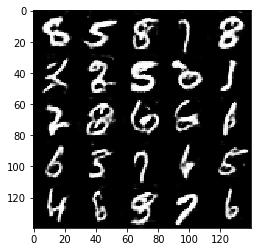

Epochs: 1/2. Discriminator Loss: 1.119 Generator Loss: 0.782
Epochs: 1/2. Discriminator Loss: 0.962 Generator Loss: 0.911
Epochs: 1/2. Discriminator Loss: 0.927 Generator Loss: 1.334
Epochs: 1/2. Discriminator Loss: 0.849 Generator Loss: 1.371
Epochs: 1/2. Discriminator Loss: 1.819 Generator Loss: 0.307
Epochs: 1/2. Discriminator Loss: 1.373 Generator Loss: 0.494
Epochs: 1/2. Discriminator Loss: 0.862 Generator Loss: 1.067
Epochs: 1/2. Discriminator Loss: 1.315 Generator Loss: 0.591
Epochs: 1/2. Discriminator Loss: 0.945 Generator Loss: 2.068
Epochs: 1/2. Discriminator Loss: 1.38 Generator Loss: 2.045


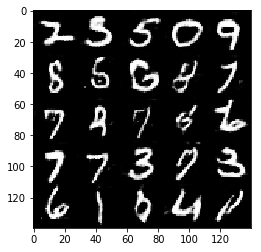

Epochs: 1/2. Discriminator Loss: 0.966 Generator Loss: 0.97
Epochs: 1/2. Discriminator Loss: 1.164 Generator Loss: 0.644
Epochs: 1/2. Discriminator Loss: 0.872 Generator Loss: 1.387
Epochs: 1/2. Discriminator Loss: 1.128 Generator Loss: 0.802
Epochs: 1/2. Discriminator Loss: 1.371 Generator Loss: 0.518
Epochs: 1/2. Discriminator Loss: 1.502 Generator Loss: 0.513
Epochs: 1/2. Discriminator Loss: 1.003 Generator Loss: 0.81
Epochs: 1/2. Discriminator Loss: 0.697 Generator Loss: 1.606
Epochs: 1/2. Discriminator Loss: 0.945 Generator Loss: 1.128
Epochs: 1/2. Discriminator Loss: 0.99 Generator Loss: 0.954


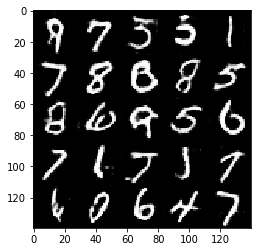

Epochs: 1/2. Discriminator Loss: 1.744 Generator Loss: 0.397
Epochs: 1/2. Discriminator Loss: 0.774 Generator Loss: 1.327
Epochs: 1/2. Discriminator Loss: 1.295 Generator Loss: 0.617
Epochs: 1/2. Discriminator Loss: 0.878 Generator Loss: 1.134
Epochs: 1/2. Discriminator Loss: 0.811 Generator Loss: 1.2
Epochs: 1/2. Discriminator Loss: 1.358 Generator Loss: 0.493
Epochs: 1/2. Discriminator Loss: 1.465 Generator Loss: 0.483
Epochs: 1/2. Discriminator Loss: 1.241 Generator Loss: 0.559
Epochs: 1/2. Discriminator Loss: 0.966 Generator Loss: 0.851
Epochs: 1/2. Discriminator Loss: 0.904 Generator Loss: 1.228


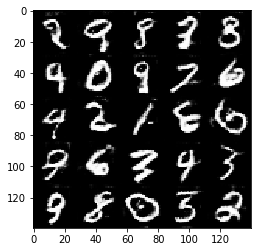

Epochs: 1/2. Discriminator Loss: 1.026 Generator Loss: 0.829
Epochs: 1/2. Discriminator Loss: 1.107 Generator Loss: 0.793
Epochs: 1/2. Discriminator Loss: 1.346 Generator Loss: 0.6
Epochs: 1/2. Discriminator Loss: 1.527 Generator Loss: 0.425
Epochs: 1/2. Discriminator Loss: 1.311 Generator Loss: 0.522
Epochs: 1/2. Discriminator Loss: 1.506 Generator Loss: 0.421
Epochs: 1/2. Discriminator Loss: 1.067 Generator Loss: 0.78
Epochs: 1/2. Discriminator Loss: 0.912 Generator Loss: 0.934
Epochs: 1/2. Discriminator Loss: 1.012 Generator Loss: 0.845
Epochs: 1/2. Discriminator Loss: 1.616 Generator Loss: 0.441


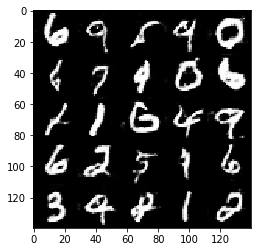

Epochs: 1/2. Discriminator Loss: 0.86 Generator Loss: 1.05
Epochs: 1/2. Discriminator Loss: 1.42 Generator Loss: 0.569
Epochs: 1/2. Discriminator Loss: 1.027 Generator Loss: 0.95
Epochs: 1/2. Discriminator Loss: 1.471 Generator Loss: 0.456
Epochs: 1/2. Discriminator Loss: 0.724 Generator Loss: 1.567
Epochs: 1/2. Discriminator Loss: 0.933 Generator Loss: 1.07
Epochs: 1/2. Discriminator Loss: 1.215 Generator Loss: 0.608
Epochs: 1/2. Discriminator Loss: 1.837 Generator Loss: 0.366
Epochs: 1/2. Discriminator Loss: 0.801 Generator Loss: 1.149
Epochs: 1/2. Discriminator Loss: 1.016 Generator Loss: 0.92


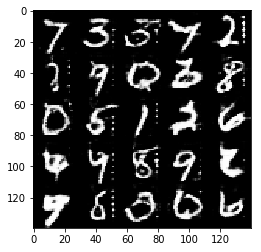

Epochs: 1/2. Discriminator Loss: 1.582 Generator Loss: 0.408
Epochs: 1/2. Discriminator Loss: 1.617 Generator Loss: 0.42
Epochs: 1/2. Discriminator Loss: 1.165 Generator Loss: 0.702
Epochs: 1/2. Discriminator Loss: 0.853 Generator Loss: 1.577
Epochs: 1/2. Discriminator Loss: 0.689 Generator Loss: 1.93
Epochs: 1/2. Discriminator Loss: 1.154 Generator Loss: 0.674
Epochs: 1/2. Discriminator Loss: 1.291 Generator Loss: 1.863
Epochs: 1/2. Discriminator Loss: 0.735 Generator Loss: 1.504
Epochs: 1/2. Discriminator Loss: 1.095 Generator Loss: 0.8
Epochs: 1/2. Discriminator Loss: 1.13 Generator Loss: 0.677


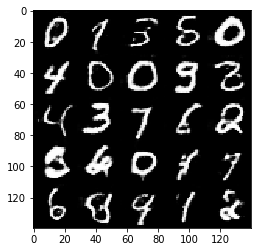

Epochs: 1/2. Discriminator Loss: 1.684 Generator Loss: 0.394
Epochs: 1/2. Discriminator Loss: 1.253 Generator Loss: 1.107
Epochs: 1/2. Discriminator Loss: 1.602 Generator Loss: 0.432
Epochs: 1/2. Discriminator Loss: 1.256 Generator Loss: 1.785
Epochs: 1/2. Discriminator Loss: 0.824 Generator Loss: 1.244
Epochs: 1/2. Discriminator Loss: 1.599 Generator Loss: 0.432
Epochs: 1/2. Discriminator Loss: 1.004 Generator Loss: 0.911
Epochs: 1/2. Discriminator Loss: 1.299 Generator Loss: 0.577
Epochs: 1/2. Discriminator Loss: 0.851 Generator Loss: 1.214
Epochs: 1/2. Discriminator Loss: 0.816 Generator Loss: 1.58


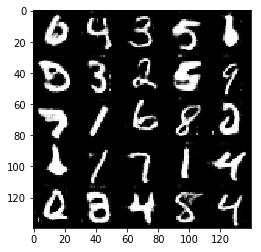

Epochs: 1/2. Discriminator Loss: 1.736 Generator Loss: 0.36
Epochs: 1/2. Discriminator Loss: 0.966 Generator Loss: 0.991
Epochs: 1/2. Discriminator Loss: 0.915 Generator Loss: 0.945
Epochs: 1/2. Discriminator Loss: 1.642 Generator Loss: 0.379
Epochs: 1/2. Discriminator Loss: 1.238 Generator Loss: 0.619
Epochs: 1/2. Discriminator Loss: 1.029 Generator Loss: 0.947
Epochs: 1/2. Discriminator Loss: 1.081 Generator Loss: 0.775
Epochs: 1/2. Discriminator Loss: 1.081 Generator Loss: 0.785
Epochs: 1/2. Discriminator Loss: 1.082 Generator Loss: 0.765
Epochs: 1/2. Discriminator Loss: 0.839 Generator Loss: 1.549


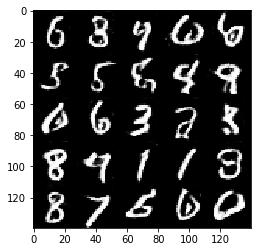

Epochs: 1/2. Discriminator Loss: 1.032 Generator Loss: 0.754
Epochs: 1/2. Discriminator Loss: 0.834 Generator Loss: 1.204
Epochs: 1/2. Discriminator Loss: 1.036 Generator Loss: 1.02
Epochs: 1/2. Discriminator Loss: 1.379 Generator Loss: 0.53
Epochs: 1/2. Discriminator Loss: 1.252 Generator Loss: 0.555
Epochs: 1/2. Discriminator Loss: 1.014 Generator Loss: 0.824
Epochs: 1/2. Discriminator Loss: 0.837 Generator Loss: 1.042
Epochs: 1/2. Discriminator Loss: 1.273 Generator Loss: 0.555
Epochs: 1/2. Discriminator Loss: 0.988 Generator Loss: 1.007
Epochs: 1/2. Discriminator Loss: 0.842 Generator Loss: 1.322


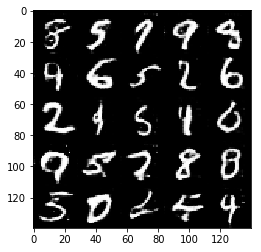

Epochs: 1/2. Discriminator Loss: 1.226 Generator Loss: 0.855
Epochs: 1/2. Discriminator Loss: 1.129 Generator Loss: 0.835
Epochs: 1/2. Discriminator Loss: 0.765 Generator Loss: 1.241
Epochs: 1/2. Discriminator Loss: 1.54 Generator Loss: 0.445
Epochs: 1/2. Discriminator Loss: 1.0 Generator Loss: 1.933
Epochs: 1/2. Discriminator Loss: 0.874 Generator Loss: 1.096
Epochs: 1/2. Discriminator Loss: 0.908 Generator Loss: 0.933
Epochs: 1/2. Discriminator Loss: 0.867 Generator Loss: 2.701
Epochs: 1/2. Discriminator Loss: 1.026 Generator Loss: 2.291
Epochs: 1/2. Discriminator Loss: 2.003 Generator Loss: 0.268


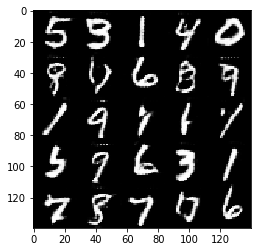

Epochs: 1/2. Discriminator Loss: 0.737 Generator Loss: 1.383
Epochs: 1/2. Discriminator Loss: 2.111 Generator Loss: 0.23
Epochs: 1/2. Discriminator Loss: 1.493 Generator Loss: 0.436
Epochs: 1/2. Discriminator Loss: 0.631 Generator Loss: 1.491
Epochs: 1/2. Discriminator Loss: 0.645 Generator Loss: 1.555
Epochs: 1/2. Discriminator Loss: 0.858 Generator Loss: 1.229
Epochs: 1/2. Discriminator Loss: 1.253 Generator Loss: 0.657
Epochs: 1/2. Discriminator Loss: 0.665 Generator Loss: 1.391
Epochs: 1/2. Discriminator Loss: 0.942 Generator Loss: 0.973
Epochs: 1/2. Discriminator Loss: 0.974 Generator Loss: 0.843


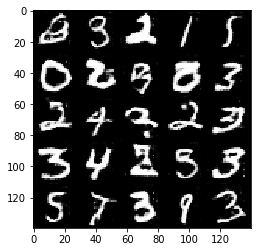

Epochs: 1/2. Discriminator Loss: 0.974 Generator Loss: 0.87
Epochs: 1/2. Discriminator Loss: 1.355 Generator Loss: 0.611
Epochs: 1/2. Discriminator Loss: 0.76 Generator Loss: 1.208
Epochs: 1/2. Discriminator Loss: 2.034 Generator Loss: 0.273
Epochs: 1/2. Discriminator Loss: 1.887 Generator Loss: 0.347
Epochs: 1/2. Discriminator Loss: 0.71 Generator Loss: 1.325
Epochs: 1/2. Discriminator Loss: 0.896 Generator Loss: 1.907
Epochs: 1/2. Discriminator Loss: 1.408 Generator Loss: 0.461
Epochs: 1/2. Discriminator Loss: 0.767 Generator Loss: 1.22
Epochs: 1/2. Discriminator Loss: 0.715 Generator Loss: 1.814


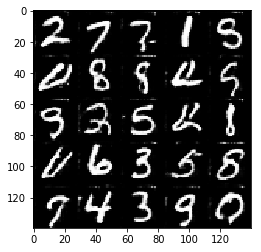

Epochs: 1/2. Discriminator Loss: 0.902 Generator Loss: 0.96
Epochs: 1/2. Discriminator Loss: 0.663 Generator Loss: 1.521
Epochs: 1/2. Discriminator Loss: 2.242 Generator Loss: 0.217
Epochs: 1/2. Discriminator Loss: 0.627 Generator Loss: 1.56
Epochs: 1/2. Discriminator Loss: 0.792 Generator Loss: 1.228
Epochs: 1/2. Discriminator Loss: 1.901 Generator Loss: 0.33
Epochs: 1/2. Discriminator Loss: 0.555 Generator Loss: 1.831
Epochs: 1/2. Discriminator Loss: 1.483 Generator Loss: 0.444
Epochs: 1/2. Discriminator Loss: 1.258 Generator Loss: 0.593
Epochs: 1/2. Discriminator Loss: 0.701 Generator Loss: 1.382


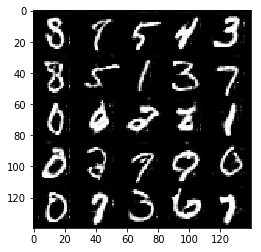

Epochs: 1/2. Discriminator Loss: 0.908 Generator Loss: 1.076
Epochs: 1/2. Discriminator Loss: 0.789 Generator Loss: 1.188
Epochs: 1/2. Discriminator Loss: 0.93 Generator Loss: 0.909
Epochs: 1/2. Discriminator Loss: 0.834 Generator Loss: 1.067
Epochs: 1/2. Discriminator Loss: 1.002 Generator Loss: 0.862
Epochs: 1/2. Discriminator Loss: 2.11 Generator Loss: 0.271
Epochs: 1/2. Discriminator Loss: 0.694 Generator Loss: 1.789
Epochs: 1/2. Discriminator Loss: 1.311 Generator Loss: 0.529
Epochs: 1/2. Discriminator Loss: 0.759 Generator Loss: 1.16
Epochs: 1/2. Discriminator Loss: 1.019 Generator Loss: 0.78


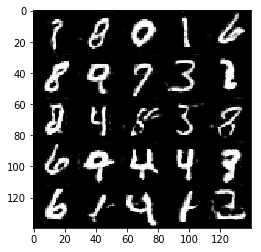

Epochs: 1/2. Discriminator Loss: 0.918 Generator Loss: 2.195
Epochs: 1/2. Discriminator Loss: 0.839 Generator Loss: 1.075
Epochs: 1/2. Discriminator Loss: 0.797 Generator Loss: 1.447
Epochs: 1/2. Discriminator Loss: 1.343 Generator Loss: 1.614
Epochs: 1/2. Discriminator Loss: 0.876 Generator Loss: 1.623
Epochs: 1/2. Discriminator Loss: 1.502 Generator Loss: 0.446
Epochs: 1/2. Discriminator Loss: 1.943 Generator Loss: 0.262
Epochs: 1/2. Discriminator Loss: 0.639 Generator Loss: 2.164
Epochs: 1/2. Discriminator Loss: 0.545 Generator Loss: 2.872
Epochs: 1/2. Discriminator Loss: 1.547 Generator Loss: 0.458


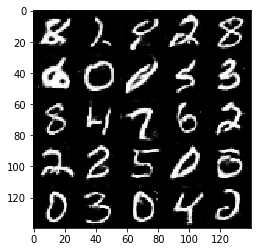

Epochs: 1/2. Discriminator Loss: 0.907 Generator Loss: 1.615
Epochs: 1/2. Discriminator Loss: 0.684 Generator Loss: 1.614
Epochs: 1/2. Discriminator Loss: 0.85 Generator Loss: 1.156
Epochs: 1/2. Discriminator Loss: 1.517 Generator Loss: 0.422
Epochs: 2/2. Discriminator Loss: 0.646 Generator Loss: 1.483
Epochs: 2/2. Discriminator Loss: 1.537 Generator Loss: 0.44
Epochs: 2/2. Discriminator Loss: 0.924 Generator Loss: 0.893
Epochs: 2/2. Discriminator Loss: 0.911 Generator Loss: 0.948
Epochs: 2/2. Discriminator Loss: 0.805 Generator Loss: 1.877
Epochs: 2/2. Discriminator Loss: 0.666 Generator Loss: 1.766


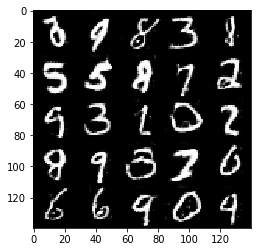

Epochs: 2/2. Discriminator Loss: 1.367 Generator Loss: 0.532
Epochs: 2/2. Discriminator Loss: 1.481 Generator Loss: 0.5
Epochs: 2/2. Discriminator Loss: 1.546 Generator Loss: 0.477
Epochs: 2/2. Discriminator Loss: 0.954 Generator Loss: 0.89
Epochs: 2/2. Discriminator Loss: 0.788 Generator Loss: 1.152
Epochs: 2/2. Discriminator Loss: 1.317 Generator Loss: 0.563
Epochs: 2/2. Discriminator Loss: 0.499 Generator Loss: 2.063
Epochs: 2/2. Discriminator Loss: 0.986 Generator Loss: 1.075
Epochs: 2/2. Discriminator Loss: 0.572 Generator Loss: 1.689
Epochs: 2/2. Discriminator Loss: 1.47 Generator Loss: 0.437


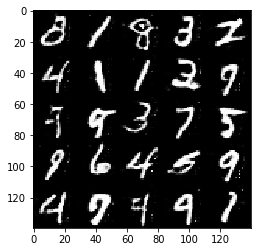

Epochs: 2/2. Discriminator Loss: 1.33 Generator Loss: 0.526
Epochs: 2/2. Discriminator Loss: 0.924 Generator Loss: 0.994
Epochs: 2/2. Discriminator Loss: 2.088 Generator Loss: 0.273
Epochs: 2/2. Discriminator Loss: 0.851 Generator Loss: 1.005
Epochs: 2/2. Discriminator Loss: 0.876 Generator Loss: 2.026
Epochs: 2/2. Discriminator Loss: 0.655 Generator Loss: 1.489
Epochs: 2/2. Discriminator Loss: 1.599 Generator Loss: 0.402
Epochs: 2/2. Discriminator Loss: 1.061 Generator Loss: 0.851
Epochs: 2/2. Discriminator Loss: 0.769 Generator Loss: 1.574
Epochs: 2/2. Discriminator Loss: 2.0 Generator Loss: 0.249


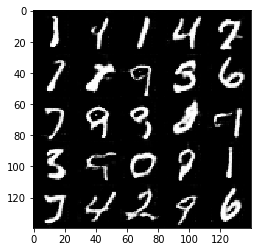

Epochs: 2/2. Discriminator Loss: 0.949 Generator Loss: 0.875
Epochs: 2/2. Discriminator Loss: 1.067 Generator Loss: 0.877
Epochs: 2/2. Discriminator Loss: 0.713 Generator Loss: 1.484
Epochs: 2/2. Discriminator Loss: 1.691 Generator Loss: 0.344
Epochs: 2/2. Discriminator Loss: 0.853 Generator Loss: 1.825
Epochs: 2/2. Discriminator Loss: 0.557 Generator Loss: 1.967
Epochs: 2/2. Discriminator Loss: 0.795 Generator Loss: 1.194
Epochs: 2/2. Discriminator Loss: 1.402 Generator Loss: 0.548
Epochs: 2/2. Discriminator Loss: 0.669 Generator Loss: 1.558
Epochs: 2/2. Discriminator Loss: 0.91 Generator Loss: 1.101


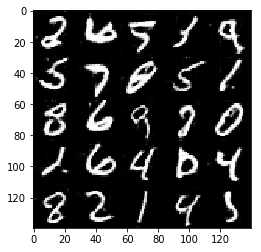

Epochs: 2/2. Discriminator Loss: 0.891 Generator Loss: 0.931
Epochs: 2/2. Discriminator Loss: 1.55 Generator Loss: 0.402
Epochs: 2/2. Discriminator Loss: 0.922 Generator Loss: 0.988
Epochs: 2/2. Discriminator Loss: 0.815 Generator Loss: 1.177
Epochs: 2/2. Discriminator Loss: 2.492 Generator Loss: 0.161
Epochs: 2/2. Discriminator Loss: 1.9 Generator Loss: 0.308
Epochs: 2/2. Discriminator Loss: 0.566 Generator Loss: 1.906
Epochs: 2/2. Discriminator Loss: 1.552 Generator Loss: 0.407
Epochs: 2/2. Discriminator Loss: 0.587 Generator Loss: 1.64
Epochs: 2/2. Discriminator Loss: 0.686 Generator Loss: 1.413


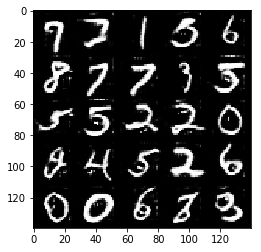

Epochs: 2/2. Discriminator Loss: 1.764 Generator Loss: 0.371
Epochs: 2/2. Discriminator Loss: 1.819 Generator Loss: 0.351
Epochs: 2/2. Discriminator Loss: 1.303 Generator Loss: 2.931
Epochs: 2/2. Discriminator Loss: 0.754 Generator Loss: 1.257
Epochs: 2/2. Discriminator Loss: 0.724 Generator Loss: 1.647
Epochs: 2/2. Discriminator Loss: 2.332 Generator Loss: 0.197
Epochs: 2/2. Discriminator Loss: 0.652 Generator Loss: 1.719
Epochs: 2/2. Discriminator Loss: 1.066 Generator Loss: 2.168
Epochs: 2/2. Discriminator Loss: 1.212 Generator Loss: 0.642
Epochs: 2/2. Discriminator Loss: 0.621 Generator Loss: 1.716


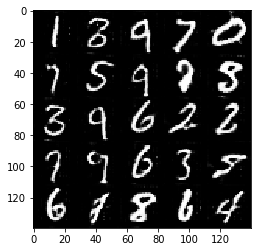

Epochs: 2/2. Discriminator Loss: 0.626 Generator Loss: 1.666
Epochs: 2/2. Discriminator Loss: 0.604 Generator Loss: 1.595
Epochs: 2/2. Discriminator Loss: 0.615 Generator Loss: 1.682
Epochs: 2/2. Discriminator Loss: 1.044 Generator Loss: 0.785
Epochs: 2/2. Discriminator Loss: 0.623 Generator Loss: 1.52
Epochs: 2/2. Discriminator Loss: 1.749 Generator Loss: 0.375
Epochs: 2/2. Discriminator Loss: 1.344 Generator Loss: 0.657
Epochs: 2/2. Discriminator Loss: 0.88 Generator Loss: 1.028
Epochs: 2/2. Discriminator Loss: 1.089 Generator Loss: 0.741
Epochs: 2/2. Discriminator Loss: 1.612 Generator Loss: 0.387


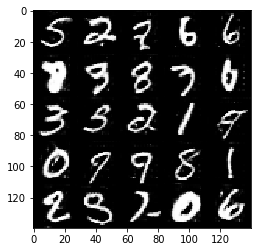

Epochs: 2/2. Discriminator Loss: 1.102 Generator Loss: 0.772
Epochs: 2/2. Discriminator Loss: 0.685 Generator Loss: 2.632
Epochs: 2/2. Discriminator Loss: 2.045 Generator Loss: 0.236
Epochs: 2/2. Discriminator Loss: 2.091 Generator Loss: 3.825
Epochs: 2/2. Discriminator Loss: 0.835 Generator Loss: 1.075
Epochs: 2/2. Discriminator Loss: 1.052 Generator Loss: 0.789
Epochs: 2/2. Discriminator Loss: 1.284 Generator Loss: 1.081
Epochs: 2/2. Discriminator Loss: 2.11 Generator Loss: 0.25
Epochs: 2/2. Discriminator Loss: 1.281 Generator Loss: 0.639
Epochs: 2/2. Discriminator Loss: 0.866 Generator Loss: 1.138


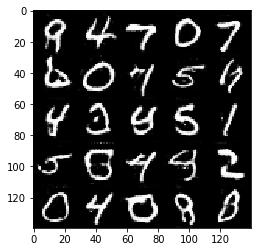

Epochs: 2/2. Discriminator Loss: 0.708 Generator Loss: 1.315
Epochs: 2/2. Discriminator Loss: 1.643 Generator Loss: 0.426
Epochs: 2/2. Discriminator Loss: 0.768 Generator Loss: 1.63
Epochs: 2/2. Discriminator Loss: 1.423 Generator Loss: 0.504
Epochs: 2/2. Discriminator Loss: 0.739 Generator Loss: 1.319
Epochs: 2/2. Discriminator Loss: 1.021 Generator Loss: 0.858
Epochs: 2/2. Discriminator Loss: 0.492 Generator Loss: 2.123
Epochs: 2/2. Discriminator Loss: 0.816 Generator Loss: 1.342
Epochs: 2/2. Discriminator Loss: 0.765 Generator Loss: 1.326
Epochs: 2/2. Discriminator Loss: 2.411 Generator Loss: 0.184


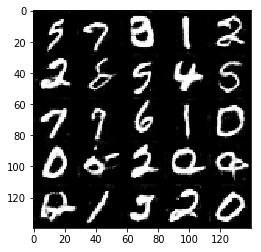

Epochs: 2/2. Discriminator Loss: 1.036 Generator Loss: 1.731
Epochs: 2/2. Discriminator Loss: 0.629 Generator Loss: 2.714
Epochs: 2/2. Discriminator Loss: 0.936 Generator Loss: 0.88
Epochs: 2/2. Discriminator Loss: 1.54 Generator Loss: 0.466
Epochs: 2/2. Discriminator Loss: 1.727 Generator Loss: 0.368
Epochs: 2/2. Discriminator Loss: 1.145 Generator Loss: 0.758
Epochs: 2/2. Discriminator Loss: 1.488 Generator Loss: 0.469
Epochs: 2/2. Discriminator Loss: 0.677 Generator Loss: 2.361
Epochs: 2/2. Discriminator Loss: 0.869 Generator Loss: 1.056
Epochs: 2/2. Discriminator Loss: 0.966 Generator Loss: 0.898


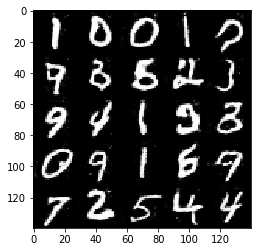

Epochs: 2/2. Discriminator Loss: 1.339 Generator Loss: 0.571
Epochs: 2/2. Discriminator Loss: 1.011 Generator Loss: 1.554
Epochs: 2/2. Discriminator Loss: 1.05 Generator Loss: 0.745
Epochs: 2/2. Discriminator Loss: 0.752 Generator Loss: 1.261
Epochs: 2/2. Discriminator Loss: 0.995 Generator Loss: 0.987
Epochs: 2/2. Discriminator Loss: 0.778 Generator Loss: 1.126
Epochs: 2/2. Discriminator Loss: 0.671 Generator Loss: 1.375
Epochs: 2/2. Discriminator Loss: 1.195 Generator Loss: 0.619
Epochs: 2/2. Discriminator Loss: 0.853 Generator Loss: 0.996
Epochs: 2/2. Discriminator Loss: 0.973 Generator Loss: 0.975


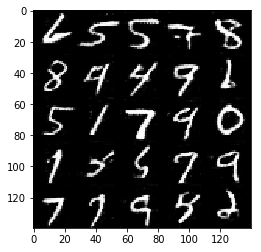

Epochs: 2/2. Discriminator Loss: 0.941 Generator Loss: 1.559
Epochs: 2/2. Discriminator Loss: 0.718 Generator Loss: 1.227
Epochs: 2/2. Discriminator Loss: 0.783 Generator Loss: 1.456
Epochs: 2/2. Discriminator Loss: 0.696 Generator Loss: 1.344
Epochs: 2/2. Discriminator Loss: 2.032 Generator Loss: 0.286
Epochs: 2/2. Discriminator Loss: 0.6 Generator Loss: 1.706
Epochs: 2/2. Discriminator Loss: 1.495 Generator Loss: 0.514
Epochs: 2/2. Discriminator Loss: 1.627 Generator Loss: 0.435
Epochs: 2/2. Discriminator Loss: 2.218 Generator Loss: 2.998
Epochs: 2/2. Discriminator Loss: 0.696 Generator Loss: 1.412


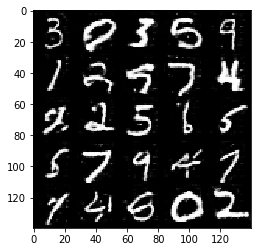

Epochs: 2/2. Discriminator Loss: 1.057 Generator Loss: 0.919
Epochs: 2/2. Discriminator Loss: 0.512 Generator Loss: 2.606
Epochs: 2/2. Discriminator Loss: 1.564 Generator Loss: 0.405
Epochs: 2/2. Discriminator Loss: 0.678 Generator Loss: 1.431
Epochs: 2/2. Discriminator Loss: 0.576 Generator Loss: 1.723
Epochs: 2/2. Discriminator Loss: 0.724 Generator Loss: 1.539
Epochs: 2/2. Discriminator Loss: 0.8 Generator Loss: 1.103
Epochs: 2/2. Discriminator Loss: 1.903 Generator Loss: 0.285
Epochs: 2/2. Discriminator Loss: 0.505 Generator Loss: 2.478
Epochs: 2/2. Discriminator Loss: 1.301 Generator Loss: 0.603


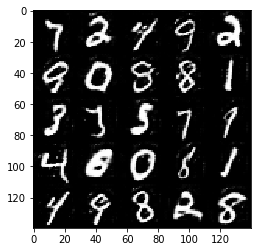

Epochs: 2/2. Discriminator Loss: 0.909 Generator Loss: 1.028
Epochs: 2/2. Discriminator Loss: 0.774 Generator Loss: 1.227
Epochs: 2/2. Discriminator Loss: 0.846 Generator Loss: 1.247
Epochs: 2/2. Discriminator Loss: 0.641 Generator Loss: 1.58
Epochs: 2/2. Discriminator Loss: 0.81 Generator Loss: 1.164
Epochs: 2/2. Discriminator Loss: 1.082 Generator Loss: 0.818
Epochs: 2/2. Discriminator Loss: 1.649 Generator Loss: 0.375
Epochs: 2/2. Discriminator Loss: 1.374 Generator Loss: 0.605
Epochs: 2/2. Discriminator Loss: 1.055 Generator Loss: 1.092
Epochs: 2/2. Discriminator Loss: 1.038 Generator Loss: 0.825


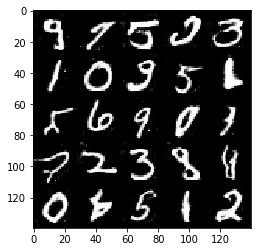

Epochs: 2/2. Discriminator Loss: 1.132 Generator Loss: 0.679
Epochs: 2/2. Discriminator Loss: 0.732 Generator Loss: 1.482
Epochs: 2/2. Discriminator Loss: 2.271 Generator Loss: 0.185
Epochs: 2/2. Discriminator Loss: 1.147 Generator Loss: 0.668
Epochs: 2/2. Discriminator Loss: 0.461 Generator Loss: 2.313
Epochs: 2/2. Discriminator Loss: 0.727 Generator Loss: 1.336
Epochs: 2/2. Discriminator Loss: 0.651 Generator Loss: 1.536
Epochs: 2/2. Discriminator Loss: 1.32 Generator Loss: 0.59
Epochs: 2/2. Discriminator Loss: 0.584 Generator Loss: 2.579
Epochs: 2/2. Discriminator Loss: 1.237 Generator Loss: 0.667


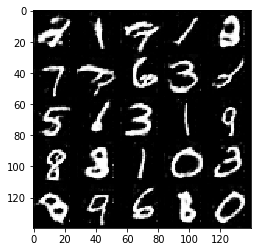

Epochs: 2/2. Discriminator Loss: 2.88 Generator Loss: 0.117
Epochs: 2/2. Discriminator Loss: 1.166 Generator Loss: 0.784
Epochs: 2/2. Discriminator Loss: 0.933 Generator Loss: 0.987
Epochs: 2/2. Discriminator Loss: 0.633 Generator Loss: 1.507
Epochs: 2/2. Discriminator Loss: 0.831 Generator Loss: 1.145
Epochs: 2/2. Discriminator Loss: 0.843 Generator Loss: 1.731
Epochs: 2/2. Discriminator Loss: 0.77 Generator Loss: 1.184
Epochs: 2/2. Discriminator Loss: 0.721 Generator Loss: 1.332
Epochs: 2/2. Discriminator Loss: 0.683 Generator Loss: 2.859
Epochs: 2/2. Discriminator Loss: 0.976 Generator Loss: 0.886


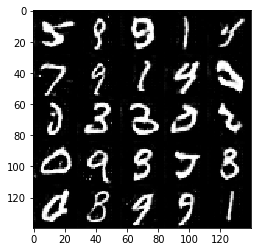

Epochs: 2/2. Discriminator Loss: 1.331 Generator Loss: 0.548
Epochs: 2/2. Discriminator Loss: 0.695 Generator Loss: 1.634
Epochs: 2/2. Discriminator Loss: 1.076 Generator Loss: 0.723
Epochs: 2/2. Discriminator Loss: 1.32 Generator Loss: 0.55
Epochs: 2/2. Discriminator Loss: 1.752 Generator Loss: 0.386
Epochs: 2/2. Discriminator Loss: 0.9 Generator Loss: 1.074
Epochs: 2/2. Discriminator Loss: 0.714 Generator Loss: 1.3
Epochs: 2/2. Discriminator Loss: 1.084 Generator Loss: 0.685
Epochs: 2/2. Discriminator Loss: 0.549 Generator Loss: 1.884
Epochs: 2/2. Discriminator Loss: 1.033 Generator Loss: 0.792


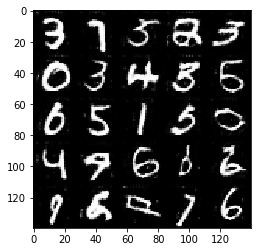

Epochs: 2/2. Discriminator Loss: 0.8 Generator Loss: 1.326
Epochs: 2/2. Discriminator Loss: 1.067 Generator Loss: 0.748
Epochs: 2/2. Discriminator Loss: 1.317 Generator Loss: 0.582
Epochs: 2/2. Discriminator Loss: 1.488 Generator Loss: 0.573
Epochs: 2/2. Discriminator Loss: 1.665 Generator Loss: 0.42
Epochs: 2/2. Discriminator Loss: 1.723 Generator Loss: 0.417
Epochs: 2/2. Discriminator Loss: 1.091 Generator Loss: 0.731
Epochs: 2/2. Discriminator Loss: 1.754 Generator Loss: 0.322
Epochs: 2/2. Discriminator Loss: 1.602 Generator Loss: 0.545
Epochs: 2/2. Discriminator Loss: 0.715 Generator Loss: 1.394


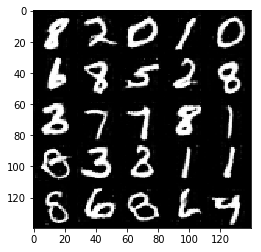

Epochs: 2/2. Discriminator Loss: 0.689 Generator Loss: 1.977
Epochs: 2/2. Discriminator Loss: 2.075 Generator Loss: 0.247
Epochs: 2/2. Discriminator Loss: 0.791 Generator Loss: 1.253
Epochs: 2/2. Discriminator Loss: 0.868 Generator Loss: 1.194
Epochs: 2/2. Discriminator Loss: 0.833 Generator Loss: 1.255
Epochs: 2/2. Discriminator Loss: 1.001 Generator Loss: 0.82
Epochs: 2/2. Discriminator Loss: 0.769 Generator Loss: 1.151
Epochs: 2/2. Discriminator Loss: 1.255 Generator Loss: 0.631
Epochs: 2/2. Discriminator Loss: 0.873 Generator Loss: 0.96
Epochs: 2/2. Discriminator Loss: 0.776 Generator Loss: 1.16


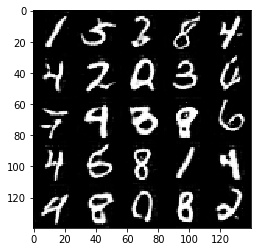

Epochs: 2/2. Discriminator Loss: 1.925 Generator Loss: 0.42
Epochs: 2/2. Discriminator Loss: 2.253 Generator Loss: 0.213


In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epochs: 0/1. Discriminator Loss: 4.151 Generator Loss: 0.431


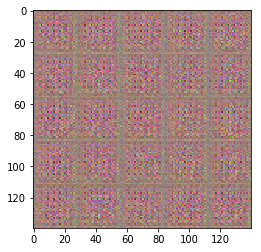

Epochs: 0/1. Discriminator Loss: 0.404 Generator Loss: 3.786
Epochs: 0/1. Discriminator Loss: 0.388 Generator Loss: 6.142
Epochs: 0/1. Discriminator Loss: 2.241 Generator Loss: 0.205
Epochs: 0/1. Discriminator Loss: 1.228 Generator Loss: 0.582
Epochs: 0/1. Discriminator Loss: 1.66 Generator Loss: 1.571
Epochs: 0/1. Discriminator Loss: 0.858 Generator Loss: 1.235
Epochs: 0/1. Discriminator Loss: 1.122 Generator Loss: 0.985
Epochs: 0/1. Discriminator Loss: 1.417 Generator Loss: 0.46
Epochs: 0/1. Discriminator Loss: 1.016 Generator Loss: 1.344
Epochs: 0/1. Discriminator Loss: 1.054 Generator Loss: 0.955


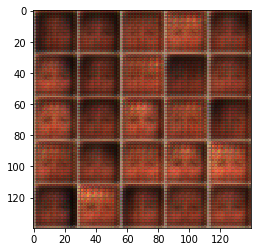

Epochs: 0/1. Discriminator Loss: 1.425 Generator Loss: 0.523
Epochs: 0/1. Discriminator Loss: 1.332 Generator Loss: 0.896
Epochs: 0/1. Discriminator Loss: 1.382 Generator Loss: 0.925
Epochs: 0/1. Discriminator Loss: 1.311 Generator Loss: 0.783
Epochs: 0/1. Discriminator Loss: 1.078 Generator Loss: 1.145
Epochs: 0/1. Discriminator Loss: 1.264 Generator Loss: 1.019
Epochs: 0/1. Discriminator Loss: 1.464 Generator Loss: 0.629
Epochs: 0/1. Discriminator Loss: 1.586 Generator Loss: 0.449
Epochs: 0/1. Discriminator Loss: 1.375 Generator Loss: 0.67
Epochs: 0/1. Discriminator Loss: 1.336 Generator Loss: 1.022


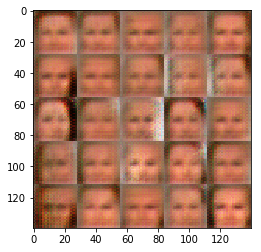

Epochs: 0/1. Discriminator Loss: 1.231 Generator Loss: 1.007
Epochs: 0/1. Discriminator Loss: 1.858 Generator Loss: 0.359
Epochs: 0/1. Discriminator Loss: 1.145 Generator Loss: 0.889
Epochs: 0/1. Discriminator Loss: 1.315 Generator Loss: 0.757
Epochs: 0/1. Discriminator Loss: 1.628 Generator Loss: 0.479
Epochs: 0/1. Discriminator Loss: 1.306 Generator Loss: 0.658
Epochs: 0/1. Discriminator Loss: 1.55 Generator Loss: 0.401
Epochs: 0/1. Discriminator Loss: 1.742 Generator Loss: 0.398
Epochs: 0/1. Discriminator Loss: 1.285 Generator Loss: 0.823
Epochs: 0/1. Discriminator Loss: 1.472 Generator Loss: 0.909


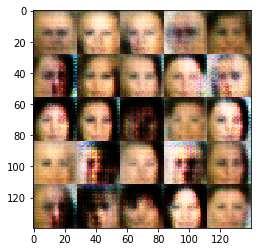

Epochs: 0/1. Discriminator Loss: 1.23 Generator Loss: 1.113
Epochs: 0/1. Discriminator Loss: 1.42 Generator Loss: 0.556
Epochs: 0/1. Discriminator Loss: 1.347 Generator Loss: 0.78
Epochs: 0/1. Discriminator Loss: 1.322 Generator Loss: 1.269
Epochs: 0/1. Discriminator Loss: 1.403 Generator Loss: 0.709
Epochs: 0/1. Discriminator Loss: 1.614 Generator Loss: 0.41
Epochs: 0/1. Discriminator Loss: 1.276 Generator Loss: 0.82
Epochs: 0/1. Discriminator Loss: 1.066 Generator Loss: 1.24
Epochs: 0/1. Discriminator Loss: 0.657 Generator Loss: 2.292
Epochs: 0/1. Discriminator Loss: 1.334 Generator Loss: 0.783


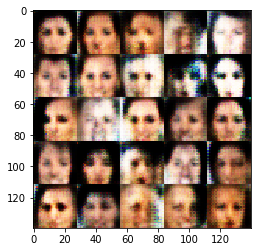

Epochs: 0/1. Discriminator Loss: 1.23 Generator Loss: 1.026
Epochs: 0/1. Discriminator Loss: 1.174 Generator Loss: 1.043
Epochs: 0/1. Discriminator Loss: 1.245 Generator Loss: 0.73
Epochs: 0/1. Discriminator Loss: 1.21 Generator Loss: 0.859
Epochs: 0/1. Discriminator Loss: 1.292 Generator Loss: 1.031
Epochs: 0/1. Discriminator Loss: 1.408 Generator Loss: 1.078
Epochs: 0/1. Discriminator Loss: 1.037 Generator Loss: 0.925
Epochs: 0/1. Discriminator Loss: 1.225 Generator Loss: 0.669
Epochs: 0/1. Discriminator Loss: 1.83 Generator Loss: 0.331
Epochs: 0/1. Discriminator Loss: 0.92 Generator Loss: 1.825


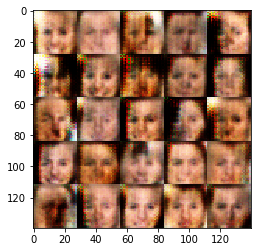

Epochs: 0/1. Discriminator Loss: 1.29 Generator Loss: 0.781
Epochs: 0/1. Discriminator Loss: 1.036 Generator Loss: 1.026
Epochs: 0/1. Discriminator Loss: 1.322 Generator Loss: 0.765
Epochs: 0/1. Discriminator Loss: 1.395 Generator Loss: 0.669
Epochs: 0/1. Discriminator Loss: 0.998 Generator Loss: 0.923
Epochs: 0/1. Discriminator Loss: 1.556 Generator Loss: 0.451
Epochs: 0/1. Discriminator Loss: 1.393 Generator Loss: 0.517
Epochs: 0/1. Discriminator Loss: 1.628 Generator Loss: 0.373
Epochs: 0/1. Discriminator Loss: 1.187 Generator Loss: 1.188
Epochs: 0/1. Discriminator Loss: 0.914 Generator Loss: 1.673


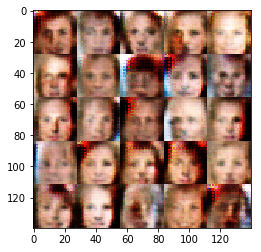

Epochs: 0/1. Discriminator Loss: 0.936 Generator Loss: 1.353
Epochs: 0/1. Discriminator Loss: 1.066 Generator Loss: 1.016
Epochs: 0/1. Discriminator Loss: 1.16 Generator Loss: 0.796
Epochs: 0/1. Discriminator Loss: 1.432 Generator Loss: 0.507
Epochs: 0/1. Discriminator Loss: 2.174 Generator Loss: 0.199
Epochs: 0/1. Discriminator Loss: 1.363 Generator Loss: 0.548
Epochs: 0/1. Discriminator Loss: 1.11 Generator Loss: 0.874
Epochs: 0/1. Discriminator Loss: 1.01 Generator Loss: 1.469
Epochs: 0/1. Discriminator Loss: 1.234 Generator Loss: 1.049
Epochs: 0/1. Discriminator Loss: 1.091 Generator Loss: 1.227


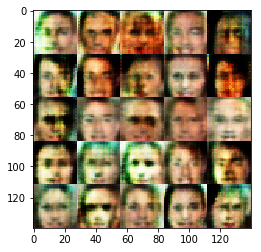

Epochs: 0/1. Discriminator Loss: 1.734 Generator Loss: 0.378
Epochs: 0/1. Discriminator Loss: 1.139 Generator Loss: 0.835
Epochs: 0/1. Discriminator Loss: 1.845 Generator Loss: 1.554
Epochs: 0/1. Discriminator Loss: 1.337 Generator Loss: 0.684
Epochs: 0/1. Discriminator Loss: 1.222 Generator Loss: 0.859
Epochs: 0/1. Discriminator Loss: 1.07 Generator Loss: 0.932
Epochs: 0/1. Discriminator Loss: 1.434 Generator Loss: 0.534
Epochs: 0/1. Discriminator Loss: 1.336 Generator Loss: 0.639
Epochs: 0/1. Discriminator Loss: 1.094 Generator Loss: 0.827
Epochs: 0/1. Discriminator Loss: 1.112 Generator Loss: 0.781


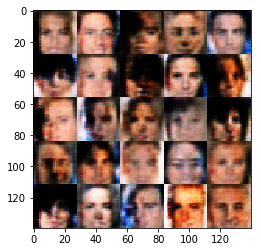

Epochs: 0/1. Discriminator Loss: 1.656 Generator Loss: 0.516
Epochs: 0/1. Discriminator Loss: 1.236 Generator Loss: 1.497
Epochs: 0/1. Discriminator Loss: 1.37 Generator Loss: 0.855
Epochs: 0/1. Discriminator Loss: 1.481 Generator Loss: 0.511
Epochs: 0/1. Discriminator Loss: 0.996 Generator Loss: 0.931
Epochs: 0/1. Discriminator Loss: 0.935 Generator Loss: 1.114
Epochs: 0/1. Discriminator Loss: 1.394 Generator Loss: 0.526
Epochs: 0/1. Discriminator Loss: 1.799 Generator Loss: 2.215
Epochs: 0/1. Discriminator Loss: 1.399 Generator Loss: 0.715
Epochs: 0/1. Discriminator Loss: 1.236 Generator Loss: 0.797


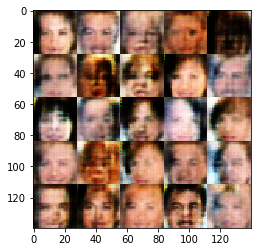

Epochs: 0/1. Discriminator Loss: 1.803 Generator Loss: 0.31
Epochs: 0/1. Discriminator Loss: 0.87 Generator Loss: 1.177
Epochs: 0/1. Discriminator Loss: 1.338 Generator Loss: 2.197
Epochs: 0/1. Discriminator Loss: 1.643 Generator Loss: 1.74
Epochs: 0/1. Discriminator Loss: 0.971 Generator Loss: 2.725
Epochs: 0/1. Discriminator Loss: 1.175 Generator Loss: 0.693
Epochs: 0/1. Discriminator Loss: 1.516 Generator Loss: 0.436
Epochs: 0/1. Discriminator Loss: 0.829 Generator Loss: 1.525
Epochs: 0/1. Discriminator Loss: 1.339 Generator Loss: 0.794
Epochs: 0/1. Discriminator Loss: 1.29 Generator Loss: 0.615


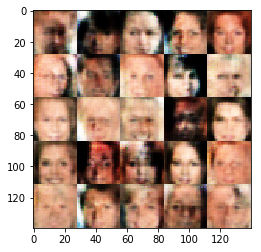

Epochs: 0/1. Discriminator Loss: 1.002 Generator Loss: 1.022
Epochs: 0/1. Discriminator Loss: 1.251 Generator Loss: 0.642
Epochs: 0/1. Discriminator Loss: 1.383 Generator Loss: 0.765
Epochs: 0/1. Discriminator Loss: 1.469 Generator Loss: 0.701
Epochs: 0/1. Discriminator Loss: 1.112 Generator Loss: 0.686
Epochs: 0/1. Discriminator Loss: 1.1 Generator Loss: 0.885
Epochs: 0/1. Discriminator Loss: 0.798 Generator Loss: 1.803
Epochs: 0/1. Discriminator Loss: 1.191 Generator Loss: 0.701
Epochs: 0/1. Discriminator Loss: 1.27 Generator Loss: 0.623
Epochs: 0/1. Discriminator Loss: 1.001 Generator Loss: 0.875


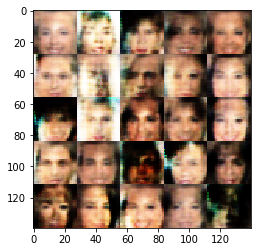

Epochs: 0/1. Discriminator Loss: 1.552 Generator Loss: 0.523
Epochs: 0/1. Discriminator Loss: 1.449 Generator Loss: 0.976
Epochs: 0/1. Discriminator Loss: 1.489 Generator Loss: 0.483
Epochs: 0/1. Discriminator Loss: 1.221 Generator Loss: 1.255
Epochs: 0/1. Discriminator Loss: 1.124 Generator Loss: 0.993
Epochs: 0/1. Discriminator Loss: 1.086 Generator Loss: 0.866
Epochs: 0/1. Discriminator Loss: 1.144 Generator Loss: 0.911
Epochs: 0/1. Discriminator Loss: 1.166 Generator Loss: 1.313
Epochs: 0/1. Discriminator Loss: 1.202 Generator Loss: 1.659
Epochs: 0/1. Discriminator Loss: 1.087 Generator Loss: 0.769


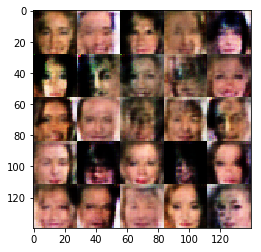

Epochs: 0/1. Discriminator Loss: 1.659 Generator Loss: 0.372
Epochs: 0/1. Discriminator Loss: 1.247 Generator Loss: 0.685
Epochs: 0/1. Discriminator Loss: 1.244 Generator Loss: 0.784
Epochs: 0/1. Discriminator Loss: 1.08 Generator Loss: 0.784
Epochs: 0/1. Discriminator Loss: 1.2 Generator Loss: 0.766
Epochs: 0/1. Discriminator Loss: 0.973 Generator Loss: 1.019
Epochs: 0/1. Discriminator Loss: 1.723 Generator Loss: 0.368
Epochs: 0/1. Discriminator Loss: 1.547 Generator Loss: 0.508
Epochs: 0/1. Discriminator Loss: 1.183 Generator Loss: 0.774
Epochs: 0/1. Discriminator Loss: 1.245 Generator Loss: 3.149


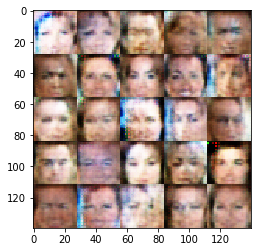

Epochs: 0/1. Discriminator Loss: 0.916 Generator Loss: 1.039
Epochs: 0/1. Discriminator Loss: 1.23 Generator Loss: 0.616
Epochs: 0/1. Discriminator Loss: 1.427 Generator Loss: 0.545
Epochs: 0/1. Discriminator Loss: 1.249 Generator Loss: 0.64
Epochs: 0/1. Discriminator Loss: 1.384 Generator Loss: 0.802
Epochs: 0/1. Discriminator Loss: 1.2 Generator Loss: 0.896
Epochs: 0/1. Discriminator Loss: 1.158 Generator Loss: 0.883
Epochs: 0/1. Discriminator Loss: 1.341 Generator Loss: 0.918
Epochs: 0/1. Discriminator Loss: 1.061 Generator Loss: 0.883
Epochs: 0/1. Discriminator Loss: 1.111 Generator Loss: 0.951


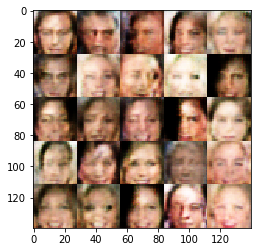

Epochs: 0/1. Discriminator Loss: 1.171 Generator Loss: 0.805
Epochs: 0/1. Discriminator Loss: 1.369 Generator Loss: 0.734
Epochs: 0/1. Discriminator Loss: 1.24 Generator Loss: 0.811
Epochs: 0/1. Discriminator Loss: 1.383 Generator Loss: 0.735
Epochs: 0/1. Discriminator Loss: 1.147 Generator Loss: 0.766
Epochs: 0/1. Discriminator Loss: 1.141 Generator Loss: 0.87
Epochs: 0/1. Discriminator Loss: 1.228 Generator Loss: 0.808
Epochs: 0/1. Discriminator Loss: 1.125 Generator Loss: 1.126
Epochs: 0/1. Discriminator Loss: 1.338 Generator Loss: 0.677
Epochs: 0/1. Discriminator Loss: 1.292 Generator Loss: 0.725


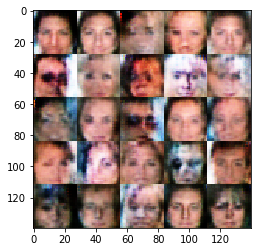

Epochs: 0/1. Discriminator Loss: 1.327 Generator Loss: 1.194
Epochs: 0/1. Discriminator Loss: 1.049 Generator Loss: 1.203
Epochs: 0/1. Discriminator Loss: 1.078 Generator Loss: 1.033
Epochs: 0/1. Discriminator Loss: 0.962 Generator Loss: 1.097
Epochs: 0/1. Discriminator Loss: 1.282 Generator Loss: 0.579
Epochs: 0/1. Discriminator Loss: 1.144 Generator Loss: 1.581
Epochs: 0/1. Discriminator Loss: 1.077 Generator Loss: 0.736
Epochs: 0/1. Discriminator Loss: 1.089 Generator Loss: 1.484
Epochs: 0/1. Discriminator Loss: 0.967 Generator Loss: 0.966
Epochs: 0/1. Discriminator Loss: 1.431 Generator Loss: 0.629


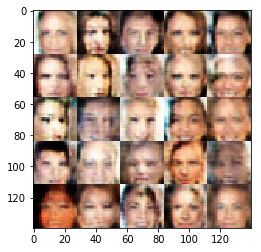

Epochs: 0/1. Discriminator Loss: 1.242 Generator Loss: 1.145
Epochs: 0/1. Discriminator Loss: 1.427 Generator Loss: 0.676
Epochs: 0/1. Discriminator Loss: 1.078 Generator Loss: 0.988
Epochs: 0/1. Discriminator Loss: 1.175 Generator Loss: 0.763
Epochs: 0/1. Discriminator Loss: 1.355 Generator Loss: 0.642
Epochs: 0/1. Discriminator Loss: 0.956 Generator Loss: 1.321
Epochs: 0/1. Discriminator Loss: 1.72 Generator Loss: 0.32
Epochs: 0/1. Discriminator Loss: 1.265 Generator Loss: 1.985
Epochs: 0/1. Discriminator Loss: 0.845 Generator Loss: 1.134
Epochs: 0/1. Discriminator Loss: 1.152 Generator Loss: 0.744


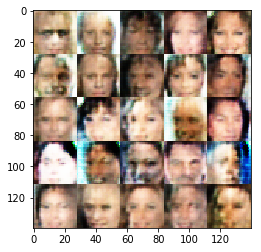

Epochs: 0/1. Discriminator Loss: 0.789 Generator Loss: 1.796
Epochs: 0/1. Discriminator Loss: 1.132 Generator Loss: 0.925
Epochs: 0/1. Discriminator Loss: 1.198 Generator Loss: 0.761
Epochs: 0/1. Discriminator Loss: 1.517 Generator Loss: 0.476
Epochs: 0/1. Discriminator Loss: 0.895 Generator Loss: 1.085
Epochs: 0/1. Discriminator Loss: 1.248 Generator Loss: 0.702
Epochs: 0/1. Discriminator Loss: 1.19 Generator Loss: 0.702
Epochs: 0/1. Discriminator Loss: 1.22 Generator Loss: 0.632
Epochs: 0/1. Discriminator Loss: 1.407 Generator Loss: 0.567
Epochs: 0/1. Discriminator Loss: 1.566 Generator Loss: 0.392


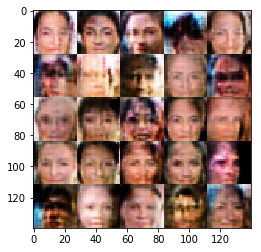

Epochs: 0/1. Discriminator Loss: 1.769 Generator Loss: 0.333
Epochs: 0/1. Discriminator Loss: 1.168 Generator Loss: 0.887
Epochs: 0/1. Discriminator Loss: 1.027 Generator Loss: 0.87
Epochs: 0/1. Discriminator Loss: 1.374 Generator Loss: 1.572
Epochs: 0/1. Discriminator Loss: 1.139 Generator Loss: 0.776
Epochs: 0/1. Discriminator Loss: 1.203 Generator Loss: 0.703
Epochs: 0/1. Discriminator Loss: 0.9 Generator Loss: 0.94
Epochs: 0/1. Discriminator Loss: 0.918 Generator Loss: 1.399
Epochs: 0/1. Discriminator Loss: 1.217 Generator Loss: 0.863
Epochs: 0/1. Discriminator Loss: 1.574 Generator Loss: 0.38


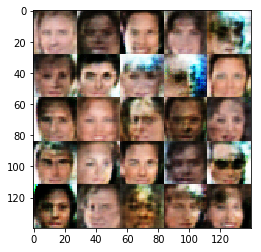

Epochs: 0/1. Discriminator Loss: 0.862 Generator Loss: 1.824
Epochs: 0/1. Discriminator Loss: 1.275 Generator Loss: 0.71
Epochs: 0/1. Discriminator Loss: 0.56 Generator Loss: 2.095
Epochs: 0/1. Discriminator Loss: 0.996 Generator Loss: 1.11
Epochs: 0/1. Discriminator Loss: 0.719 Generator Loss: 1.49
Epochs: 0/1. Discriminator Loss: 1.913 Generator Loss: 2.465
Epochs: 0/1. Discriminator Loss: 1.285 Generator Loss: 0.653
Epochs: 0/1. Discriminator Loss: 1.346 Generator Loss: 0.588
Epochs: 0/1. Discriminator Loss: 1.271 Generator Loss: 0.627
Epochs: 0/1. Discriminator Loss: 1.239 Generator Loss: 0.576


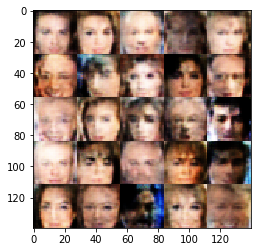

Epochs: 0/1. Discriminator Loss: 0.642 Generator Loss: 2.601
Epochs: 0/1. Discriminator Loss: 1.298 Generator Loss: 0.624
Epochs: 0/1. Discriminator Loss: 1.289 Generator Loss: 0.821
Epochs: 0/1. Discriminator Loss: 1.132 Generator Loss: 1.022
Epochs: 0/1. Discriminator Loss: 1.215 Generator Loss: 1.292
Epochs: 0/1. Discriminator Loss: 1.596 Generator Loss: 0.376
Epochs: 0/1. Discriminator Loss: 1.464 Generator Loss: 0.486
Epochs: 0/1. Discriminator Loss: 1.155 Generator Loss: 0.817
Epochs: 0/1. Discriminator Loss: 1.78 Generator Loss: 0.367
Epochs: 0/1. Discriminator Loss: 1.072 Generator Loss: 1.05


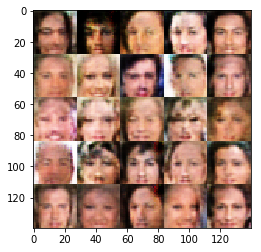

Epochs: 0/1. Discriminator Loss: 1.325 Generator Loss: 0.757
Epochs: 0/1. Discriminator Loss: 1.234 Generator Loss: 0.829
Epochs: 0/1. Discriminator Loss: 0.961 Generator Loss: 1.105
Epochs: 0/1. Discriminator Loss: 1.04 Generator Loss: 0.765
Epochs: 0/1. Discriminator Loss: 1.077 Generator Loss: 0.863
Epochs: 0/1. Discriminator Loss: 1.394 Generator Loss: 0.718
Epochs: 0/1. Discriminator Loss: 1.3 Generator Loss: 1.406
Epochs: 0/1. Discriminator Loss: 1.594 Generator Loss: 0.459
Epochs: 0/1. Discriminator Loss: 1.178 Generator Loss: 1.02
Epochs: 0/1. Discriminator Loss: 0.804 Generator Loss: 1.473


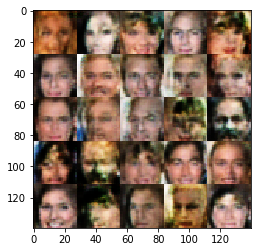

Epochs: 0/1. Discriminator Loss: 0.895 Generator Loss: 1.063
Epochs: 0/1. Discriminator Loss: 1.059 Generator Loss: 1.028
Epochs: 0/1. Discriminator Loss: 1.333 Generator Loss: 1.342
Epochs: 0/1. Discriminator Loss: 1.058 Generator Loss: 0.85
Epochs: 0/1. Discriminator Loss: 1.209 Generator Loss: 0.62
Epochs: 0/1. Discriminator Loss: 1.682 Generator Loss: 0.341
Epochs: 0/1. Discriminator Loss: 1.149 Generator Loss: 0.677
Epochs: 0/1. Discriminator Loss: 0.546 Generator Loss: 1.777
Epochs: 0/1. Discriminator Loss: 0.617 Generator Loss: 2.26
Epochs: 0/1. Discriminator Loss: 1.085 Generator Loss: 0.754


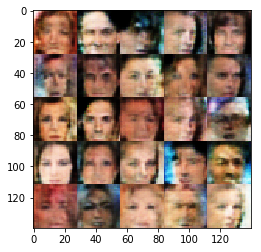

Epochs: 0/1. Discriminator Loss: 0.899 Generator Loss: 1.2
Epochs: 0/1. Discriminator Loss: 1.098 Generator Loss: 0.823
Epochs: 0/1. Discriminator Loss: 1.413 Generator Loss: 0.543
Epochs: 0/1. Discriminator Loss: 1.247 Generator Loss: 1.734
Epochs: 0/1. Discriminator Loss: 1.145 Generator Loss: 0.877
Epochs: 0/1. Discriminator Loss: 0.973 Generator Loss: 1.726
Epochs: 0/1. Discriminator Loss: 1.372 Generator Loss: 0.507
Epochs: 0/1. Discriminator Loss: 1.023 Generator Loss: 1.221
Epochs: 0/1. Discriminator Loss: 1.396 Generator Loss: 0.469
Epochs: 0/1. Discriminator Loss: 1.089 Generator Loss: 0.946


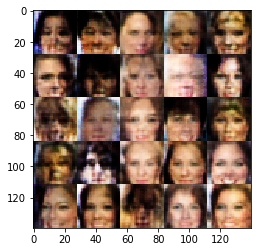

Epochs: 0/1. Discriminator Loss: 1.216 Generator Loss: 1.036
Epochs: 0/1. Discriminator Loss: 0.769 Generator Loss: 1.205
Epochs: 0/1. Discriminator Loss: 1.636 Generator Loss: 2.387
Epochs: 0/1. Discriminator Loss: 1.16 Generator Loss: 0.666
Epochs: 0/1. Discriminator Loss: 1.452 Generator Loss: 2.977
Epochs: 0/1. Discriminator Loss: 0.706 Generator Loss: 1.55
Epochs: 0/1. Discriminator Loss: 1.035 Generator Loss: 0.962
Epochs: 0/1. Discriminator Loss: 1.05 Generator Loss: 0.802
Epochs: 0/1. Discriminator Loss: 1.295 Generator Loss: 0.559
Epochs: 0/1. Discriminator Loss: 1.028 Generator Loss: 0.799


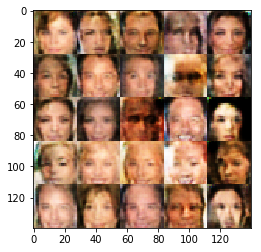

Epochs: 0/1. Discriminator Loss: 0.755 Generator Loss: 1.787
Epochs: 0/1. Discriminator Loss: 0.754 Generator Loss: 1.461
Epochs: 0/1. Discriminator Loss: 1.174 Generator Loss: 0.678
Epochs: 0/1. Discriminator Loss: 1.329 Generator Loss: 0.613
Epochs: 0/1. Discriminator Loss: 0.915 Generator Loss: 0.969
Epochs: 0/1. Discriminator Loss: 1.193 Generator Loss: 0.622
Epochs: 0/1. Discriminator Loss: 1.077 Generator Loss: 0.817
Epochs: 0/1. Discriminator Loss: 1.099 Generator Loss: 0.793
Epochs: 0/1. Discriminator Loss: 0.875 Generator Loss: 1.205
Epochs: 0/1. Discriminator Loss: 1.048 Generator Loss: 1.251


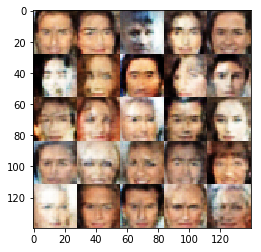

Epochs: 0/1. Discriminator Loss: 0.936 Generator Loss: 1.077
Epochs: 0/1. Discriminator Loss: 0.842 Generator Loss: 2.125
Epochs: 0/1. Discriminator Loss: 0.815 Generator Loss: 1.184
Epochs: 0/1. Discriminator Loss: 1.024 Generator Loss: 1.521
Epochs: 0/1. Discriminator Loss: 1.101 Generator Loss: 0.8
Epochs: 0/1. Discriminator Loss: 1.0 Generator Loss: 0.817
Epochs: 0/1. Discriminator Loss: 1.332 Generator Loss: 0.518
Epochs: 0/1. Discriminator Loss: 0.983 Generator Loss: 1.507
Epochs: 0/1. Discriminator Loss: 1.48 Generator Loss: 0.489
Epochs: 0/1. Discriminator Loss: 0.96 Generator Loss: 1.11


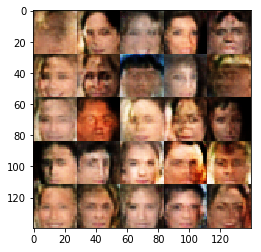

Epochs: 0/1. Discriminator Loss: 0.968 Generator Loss: 1.05
Epochs: 0/1. Discriminator Loss: 0.625 Generator Loss: 1.699
Epochs: 0/1. Discriminator Loss: 0.873 Generator Loss: 1.28
Epochs: 0/1. Discriminator Loss: 1.298 Generator Loss: 0.71
Epochs: 0/1. Discriminator Loss: 0.765 Generator Loss: 1.153
Epochs: 0/1. Discriminator Loss: 1.043 Generator Loss: 1.543
Epochs: 0/1. Discriminator Loss: 1.17 Generator Loss: 0.995
Epochs: 0/1. Discriminator Loss: 0.722 Generator Loss: 1.341
Epochs: 0/1. Discriminator Loss: 1.172 Generator Loss: 0.638
Epochs: 0/1. Discriminator Loss: 1.332 Generator Loss: 0.598


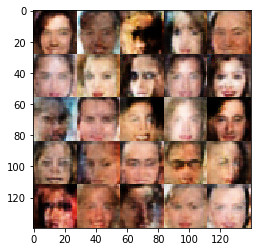

Epochs: 0/1. Discriminator Loss: 0.519 Generator Loss: 2.08
Epochs: 0/1. Discriminator Loss: 1.531 Generator Loss: 0.422
Epochs: 0/1. Discriminator Loss: 1.037 Generator Loss: 0.814
Epochs: 0/1. Discriminator Loss: 1.388 Generator Loss: 0.497
Epochs: 0/1. Discriminator Loss: 0.566 Generator Loss: 1.723
Epochs: 0/1. Discriminator Loss: 0.866 Generator Loss: 1.244
Epochs: 0/1. Discriminator Loss: 1.623 Generator Loss: 0.395
Epochs: 0/1. Discriminator Loss: 0.775 Generator Loss: 2.013
Epochs: 0/1. Discriminator Loss: 0.869 Generator Loss: 0.978
Epochs: 0/1. Discriminator Loss: 1.301 Generator Loss: 0.597


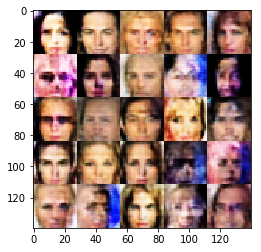

Epochs: 0/1. Discriminator Loss: 1.148 Generator Loss: 1.062
Epochs: 0/1. Discriminator Loss: 1.491 Generator Loss: 0.596
Epochs: 0/1. Discriminator Loss: 1.309 Generator Loss: 0.802
Epochs: 0/1. Discriminator Loss: 1.236 Generator Loss: 1.003
Epochs: 0/1. Discriminator Loss: 1.02 Generator Loss: 0.891
Epochs: 0/1. Discriminator Loss: 1.053 Generator Loss: 0.975
Epochs: 0/1. Discriminator Loss: 1.054 Generator Loss: 2.638
Epochs: 0/1. Discriminator Loss: 1.543 Generator Loss: 0.434
Epochs: 0/1. Discriminator Loss: 0.759 Generator Loss: 1.241
Epochs: 0/1. Discriminator Loss: 0.818 Generator Loss: 1.226


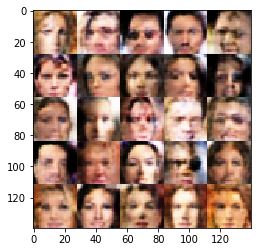

Epochs: 0/1. Discriminator Loss: 1.108 Generator Loss: 0.826
Epochs: 0/1. Discriminator Loss: 0.989 Generator Loss: 1.415
Epochs: 0/1. Discriminator Loss: 1.026 Generator Loss: 0.845
Epochs: 0/1. Discriminator Loss: 0.856 Generator Loss: 1.08
Epochs: 0/1. Discriminator Loss: 1.0 Generator Loss: 1.017
Epochs: 0/1. Discriminator Loss: 1.283 Generator Loss: 0.819
Epochs: 0/1. Discriminator Loss: 1.331 Generator Loss: 0.494
Epochs: 0/1. Discriminator Loss: 1.314 Generator Loss: 0.605
Epochs: 0/1. Discriminator Loss: 0.887 Generator Loss: 1.249
Epochs: 0/1. Discriminator Loss: 0.908 Generator Loss: 1.181


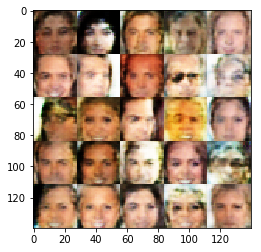

Epochs: 0/1. Discriminator Loss: 1.379 Generator Loss: 2.397
Epochs: 0/1. Discriminator Loss: 0.708 Generator Loss: 1.852
Epochs: 0/1. Discriminator Loss: 1.101 Generator Loss: 0.742
Epochs: 0/1. Discriminator Loss: 1.343 Generator Loss: 0.501
Epochs: 0/1. Discriminator Loss: 1.013 Generator Loss: 1.003
Epochs: 0/1. Discriminator Loss: 1.727 Generator Loss: 0.322
Epochs: 0/1. Discriminator Loss: 1.112 Generator Loss: 0.977
Epochs: 0/1. Discriminator Loss: 0.75 Generator Loss: 1.314
Epochs: 0/1. Discriminator Loss: 1.034 Generator Loss: 1.222
Epochs: 0/1. Discriminator Loss: 1.557 Generator Loss: 2.153


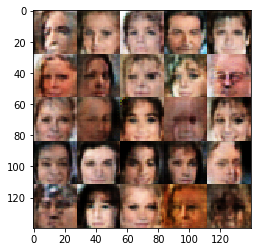

Epochs: 0/1. Discriminator Loss: 1.204 Generator Loss: 0.872
Epochs: 0/1. Discriminator Loss: 1.145 Generator Loss: 1.473
Epochs: 0/1. Discriminator Loss: 1.335 Generator Loss: 1.741
Epochs: 0/1. Discriminator Loss: 1.102 Generator Loss: 1.066
Epochs: 0/1. Discriminator Loss: 0.85 Generator Loss: 1.105
Epochs: 0/1. Discriminator Loss: 0.84 Generator Loss: 2.301
Epochs: 0/1. Discriminator Loss: 0.902 Generator Loss: 1.168
Epochs: 0/1. Discriminator Loss: 1.201 Generator Loss: 1.065
Epochs: 0/1. Discriminator Loss: 1.152 Generator Loss: 0.898
Epochs: 0/1. Discriminator Loss: 0.874 Generator Loss: 1.05


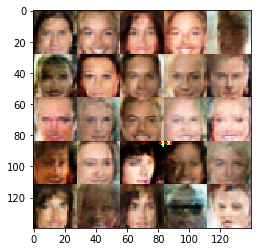

Epochs: 0/1. Discriminator Loss: 0.883 Generator Loss: 1.997
Epochs: 0/1. Discriminator Loss: 0.881 Generator Loss: 1.365
Epochs: 0/1. Discriminator Loss: 1.42 Generator Loss: 0.453
Epochs: 0/1. Discriminator Loss: 0.739 Generator Loss: 1.687
Epochs: 0/1. Discriminator Loss: 1.217 Generator Loss: 0.621
Epochs: 0/1. Discriminator Loss: 1.453 Generator Loss: 1.059
Epochs: 0/1. Discriminator Loss: 0.761 Generator Loss: 1.267
Epochs: 0/1. Discriminator Loss: 0.922 Generator Loss: 1.459
Epochs: 0/1. Discriminator Loss: 1.606 Generator Loss: 0.382
Epochs: 0/1. Discriminator Loss: 1.657 Generator Loss: 1.842


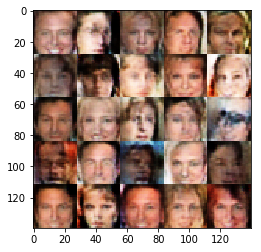

Epochs: 0/1. Discriminator Loss: 0.843 Generator Loss: 1.522
Epochs: 0/1. Discriminator Loss: 0.984 Generator Loss: 0.892
Epochs: 0/1. Discriminator Loss: 0.647 Generator Loss: 1.698
Epochs: 0/1. Discriminator Loss: 0.836 Generator Loss: 1.163
Epochs: 0/1. Discriminator Loss: 0.725 Generator Loss: 1.447
Epochs: 0/1. Discriminator Loss: 1.055 Generator Loss: 0.79
Epochs: 0/1. Discriminator Loss: 1.15 Generator Loss: 1.788
Epochs: 0/1. Discriminator Loss: 1.991 Generator Loss: 0.243
Epochs: 0/1. Discriminator Loss: 0.831 Generator Loss: 1.156
Epochs: 0/1. Discriminator Loss: 1.114 Generator Loss: 0.764


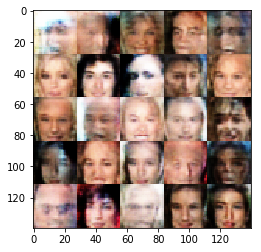

Epochs: 0/1. Discriminator Loss: 1.069 Generator Loss: 1.278
Epochs: 0/1. Discriminator Loss: 1.519 Generator Loss: 0.453
Epochs: 0/1. Discriminator Loss: 0.941 Generator Loss: 1.113
Epochs: 0/1. Discriminator Loss: 0.879 Generator Loss: 1.211
Epochs: 0/1. Discriminator Loss: 0.782 Generator Loss: 1.615
Epochs: 0/1. Discriminator Loss: 1.242 Generator Loss: 0.621
Epochs: 0/1. Discriminator Loss: 1.336 Generator Loss: 0.503
Epochs: 0/1. Discriminator Loss: 1.178 Generator Loss: 2.014
Epochs: 0/1. Discriminator Loss: 1.277 Generator Loss: 0.552
Epochs: 0/1. Discriminator Loss: 0.88 Generator Loss: 1.046


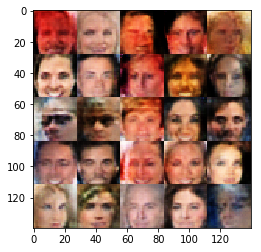

Epochs: 0/1. Discriminator Loss: 1.051 Generator Loss: 0.797
Epochs: 0/1. Discriminator Loss: 1.052 Generator Loss: 0.828
Epochs: 0/1. Discriminator Loss: 0.917 Generator Loss: 1.491
Epochs: 0/1. Discriminator Loss: 1.019 Generator Loss: 1.263
Epochs: 0/1. Discriminator Loss: 1.375 Generator Loss: 0.501
Epochs: 0/1. Discriminator Loss: 0.994 Generator Loss: 0.998
Epochs: 0/1. Discriminator Loss: 0.894 Generator Loss: 1.008
Epochs: 0/1. Discriminator Loss: 1.029 Generator Loss: 0.804
Epochs: 0/1. Discriminator Loss: 1.129 Generator Loss: 1.947
Epochs: 0/1. Discriminator Loss: 0.774 Generator Loss: 1.765


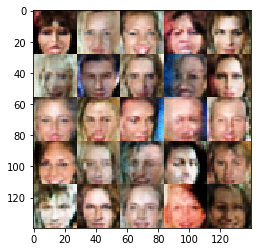

Epochs: 0/1. Discriminator Loss: 0.816 Generator Loss: 1.389
Epochs: 0/1. Discriminator Loss: 1.349 Generator Loss: 0.516
Epochs: 0/1. Discriminator Loss: 0.812 Generator Loss: 1.117
Epochs: 0/1. Discriminator Loss: 1.096 Generator Loss: 0.856
Epochs: 0/1. Discriminator Loss: 0.66 Generator Loss: 1.501
Epochs: 0/1. Discriminator Loss: 0.64 Generator Loss: 1.521
Epochs: 0/1. Discriminator Loss: 1.009 Generator Loss: 0.983
Epochs: 0/1. Discriminator Loss: 1.088 Generator Loss: 0.892
Epochs: 0/1. Discriminator Loss: 0.626 Generator Loss: 1.647
Epochs: 0/1. Discriminator Loss: 1.125 Generator Loss: 1.001


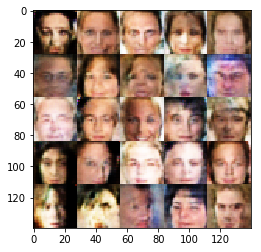

Epochs: 0/1. Discriminator Loss: 1.135 Generator Loss: 0.699
Epochs: 0/1. Discriminator Loss: 0.697 Generator Loss: 1.76
Epochs: 0/1. Discriminator Loss: 1.476 Generator Loss: 0.413
Epochs: 0/1. Discriminator Loss: 1.095 Generator Loss: 0.977
Epochs: 0/1. Discriminator Loss: 0.965 Generator Loss: 0.862
Epochs: 0/1. Discriminator Loss: 1.588 Generator Loss: 0.371
Epochs: 0/1. Discriminator Loss: 0.752 Generator Loss: 1.335
Epochs: 0/1. Discriminator Loss: 1.491 Generator Loss: 0.439
Epochs: 0/1. Discriminator Loss: 0.59 Generator Loss: 2.161
Epochs: 0/1. Discriminator Loss: 1.466 Generator Loss: 2.406


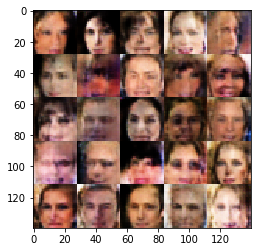

Epochs: 0/1. Discriminator Loss: 0.749 Generator Loss: 1.481
Epochs: 0/1. Discriminator Loss: 0.765 Generator Loss: 1.377
Epochs: 0/1. Discriminator Loss: 1.125 Generator Loss: 0.785
Epochs: 0/1. Discriminator Loss: 1.342 Generator Loss: 0.53
Epochs: 0/1. Discriminator Loss: 0.742 Generator Loss: 1.574
Epochs: 0/1. Discriminator Loss: 1.564 Generator Loss: 0.398
Epochs: 0/1. Discriminator Loss: 0.557 Generator Loss: 2.042
Epochs: 0/1. Discriminator Loss: 1.025 Generator Loss: 0.896
Epochs: 0/1. Discriminator Loss: 0.831 Generator Loss: 1.056
Epochs: 0/1. Discriminator Loss: 1.174 Generator Loss: 0.738


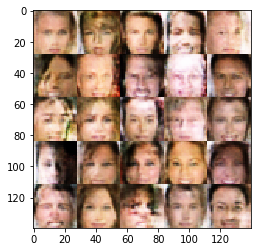

Epochs: 0/1. Discriminator Loss: 1.168 Generator Loss: 0.696
Epochs: 0/1. Discriminator Loss: 0.518 Generator Loss: 2.114
Epochs: 0/1. Discriminator Loss: 0.69 Generator Loss: 1.413
Epochs: 0/1. Discriminator Loss: 1.024 Generator Loss: 0.759
Epochs: 0/1. Discriminator Loss: 0.622 Generator Loss: 2.069
Epochs: 0/1. Discriminator Loss: 1.163 Generator Loss: 0.663
Epochs: 0/1. Discriminator Loss: 1.02 Generator Loss: 0.833
Epochs: 0/1. Discriminator Loss: 1.223 Generator Loss: 0.654
Epochs: 0/1. Discriminator Loss: 0.889 Generator Loss: 1.009
Epochs: 0/1. Discriminator Loss: 0.933 Generator Loss: 0.883


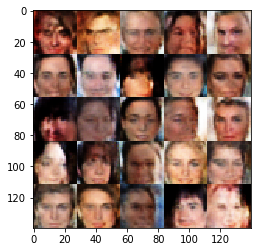

Epochs: 0/1. Discriminator Loss: 1.185 Generator Loss: 0.793
Epochs: 0/1. Discriminator Loss: 1.761 Generator Loss: 0.297
Epochs: 0/1. Discriminator Loss: 0.76 Generator Loss: 1.229
Epochs: 0/1. Discriminator Loss: 1.086 Generator Loss: 1.812
Epochs: 0/1. Discriminator Loss: 0.753 Generator Loss: 1.71
Epochs: 0/1. Discriminator Loss: 1.68 Generator Loss: 0.354
Epochs: 0/1. Discriminator Loss: 0.978 Generator Loss: 0.908
Epochs: 0/1. Discriminator Loss: 1.301 Generator Loss: 0.583
Epochs: 0/1. Discriminator Loss: 0.816 Generator Loss: 1.816
Epochs: 0/1. Discriminator Loss: 0.864 Generator Loss: 1.691


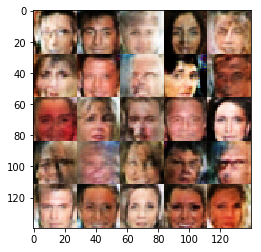

Epochs: 0/1. Discriminator Loss: 0.709 Generator Loss: 1.676
Epochs: 0/1. Discriminator Loss: 0.835 Generator Loss: 1.623
Epochs: 0/1. Discriminator Loss: 1.344 Generator Loss: 0.516
Epochs: 0/1. Discriminator Loss: 0.973 Generator Loss: 1.298
Epochs: 0/1. Discriminator Loss: 0.702 Generator Loss: 1.818
Epochs: 0/1. Discriminator Loss: 0.596 Generator Loss: 1.837
Epochs: 0/1. Discriminator Loss: 1.01 Generator Loss: 0.854
Epochs: 0/1. Discriminator Loss: 1.6 Generator Loss: 0.408
Epochs: 0/1. Discriminator Loss: 1.63 Generator Loss: 0.397
Epochs: 0/1. Discriminator Loss: 1.157 Generator Loss: 1.461


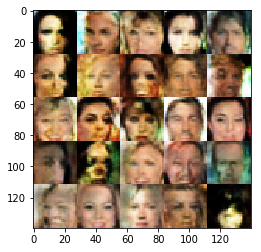

Epochs: 0/1. Discriminator Loss: 1.109 Generator Loss: 0.713
Epochs: 0/1. Discriminator Loss: 1.542 Generator Loss: 0.413
Epochs: 0/1. Discriminator Loss: 0.66 Generator Loss: 1.772
Epochs: 0/1. Discriminator Loss: 1.172 Generator Loss: 0.708
Epochs: 0/1. Discriminator Loss: 0.513 Generator Loss: 2.145
Epochs: 0/1. Discriminator Loss: 0.676 Generator Loss: 2.741
Epochs: 0/1. Discriminator Loss: 0.635 Generator Loss: 1.812
Epochs: 0/1. Discriminator Loss: 0.622 Generator Loss: 1.552
Epochs: 0/1. Discriminator Loss: 0.556 Generator Loss: 1.802
Epochs: 0/1. Discriminator Loss: 0.851 Generator Loss: 1.036


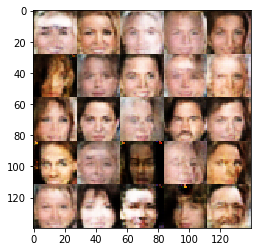

Epochs: 0/1. Discriminator Loss: 1.407 Generator Loss: 1.582
Epochs: 0/1. Discriminator Loss: 1.028 Generator Loss: 1.001
Epochs: 0/1. Discriminator Loss: 1.088 Generator Loss: 0.917
Epochs: 0/1. Discriminator Loss: 1.43 Generator Loss: 0.454
Epochs: 0/1. Discriminator Loss: 0.999 Generator Loss: 0.881
Epochs: 0/1. Discriminator Loss: 0.899 Generator Loss: 1.091
Epochs: 0/1. Discriminator Loss: 1.045 Generator Loss: 0.939
Epochs: 0/1. Discriminator Loss: 1.147 Generator Loss: 0.788
Epochs: 0/1. Discriminator Loss: 1.008 Generator Loss: 0.917
Epochs: 0/1. Discriminator Loss: 1.537 Generator Loss: 0.399


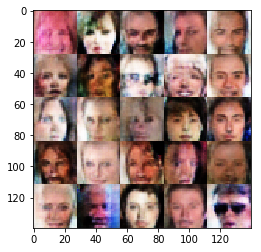

Epochs: 0/1. Discriminator Loss: 1.08 Generator Loss: 0.911
Epochs: 0/1. Discriminator Loss: 1.636 Generator Loss: 0.368
Epochs: 0/1. Discriminator Loss: 0.649 Generator Loss: 1.782
Epochs: 0/1. Discriminator Loss: 0.775 Generator Loss: 1.409
Epochs: 0/1. Discriminator Loss: 0.953 Generator Loss: 1.548
Epochs: 0/1. Discriminator Loss: 1.019 Generator Loss: 1.237
Epochs: 0/1. Discriminator Loss: 1.079 Generator Loss: 1.092
Epochs: 0/1. Discriminator Loss: 0.938 Generator Loss: 1.2
Epochs: 0/1. Discriminator Loss: 0.768 Generator Loss: 1.198
Epochs: 0/1. Discriminator Loss: 0.691 Generator Loss: 1.852


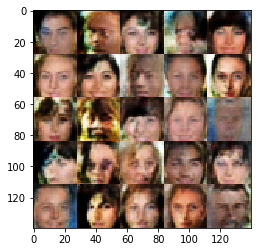

Epochs: 0/1. Discriminator Loss: 0.678 Generator Loss: 1.513
Epochs: 0/1. Discriminator Loss: 0.959 Generator Loss: 0.945
Epochs: 0/1. Discriminator Loss: 0.955 Generator Loss: 1.153
Epochs: 0/1. Discriminator Loss: 1.003 Generator Loss: 1.249
Epochs: 0/1. Discriminator Loss: 1.415 Generator Loss: 1.904
Epochs: 0/1. Discriminator Loss: 1.225 Generator Loss: 0.829
Epochs: 0/1. Discriminator Loss: 1.492 Generator Loss: 0.458
Epochs: 0/1. Discriminator Loss: 0.903 Generator Loss: 1.348
Epochs: 0/1. Discriminator Loss: 1.145 Generator Loss: 0.712
Epochs: 0/1. Discriminator Loss: 1.523 Generator Loss: 0.406


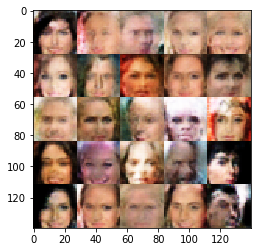

Epochs: 0/1. Discriminator Loss: 1.714 Generator Loss: 0.33
Epochs: 0/1. Discriminator Loss: 0.945 Generator Loss: 0.975
Epochs: 0/1. Discriminator Loss: 0.601 Generator Loss: 1.56
Epochs: 0/1. Discriminator Loss: 1.525 Generator Loss: 0.412
Epochs: 0/1. Discriminator Loss: 1.068 Generator Loss: 1.119
Epochs: 0/1. Discriminator Loss: 0.817 Generator Loss: 1.529
Epochs: 0/1. Discriminator Loss: 1.207 Generator Loss: 0.653
Epochs: 0/1. Discriminator Loss: 1.032 Generator Loss: 0.903
Epochs: 0/1. Discriminator Loss: 0.965 Generator Loss: 0.883
Epochs: 0/1. Discriminator Loss: 0.597 Generator Loss: 2.249


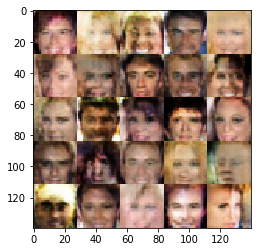

Epochs: 0/1. Discriminator Loss: 1.133 Generator Loss: 0.838
Epochs: 0/1. Discriminator Loss: 1.068 Generator Loss: 0.729
Epochs: 0/1. Discriminator Loss: 1.336 Generator Loss: 0.522
Epochs: 0/1. Discriminator Loss: 1.077 Generator Loss: 0.749
Epochs: 0/1. Discriminator Loss: 0.869 Generator Loss: 1.494
Epochs: 0/1. Discriminator Loss: 0.973 Generator Loss: 1.04
Epochs: 0/1. Discriminator Loss: 0.855 Generator Loss: 1.099
Epochs: 0/1. Discriminator Loss: 1.208 Generator Loss: 0.637
Epochs: 0/1. Discriminator Loss: 0.828 Generator Loss: 2.736
Epochs: 0/1. Discriminator Loss: 0.964 Generator Loss: 1.439


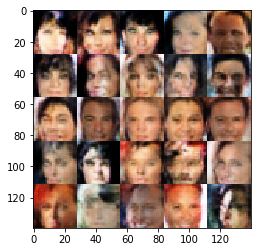

Epochs: 0/1. Discriminator Loss: 2.272 Generator Loss: 3.603
Epochs: 0/1. Discriminator Loss: 0.888 Generator Loss: 0.948
Epochs: 0/1. Discriminator Loss: 0.924 Generator Loss: 1.418
Epochs: 0/1. Discriminator Loss: 0.866 Generator Loss: 1.166
Epochs: 0/1. Discriminator Loss: 1.159 Generator Loss: 0.634
Epochs: 0/1. Discriminator Loss: 1.044 Generator Loss: 1.907
Epochs: 0/1. Discriminator Loss: 0.856 Generator Loss: 1.24
Epochs: 0/1. Discriminator Loss: 1.067 Generator Loss: 1.295
Epochs: 0/1. Discriminator Loss: 1.33 Generator Loss: 2.388
Epochs: 0/1. Discriminator Loss: 1.296 Generator Loss: 0.537


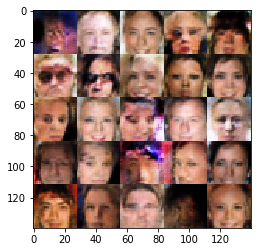

Epochs: 0/1. Discriminator Loss: 0.792 Generator Loss: 1.346
Epochs: 0/1. Discriminator Loss: 1.092 Generator Loss: 0.794
Epochs: 0/1. Discriminator Loss: 2.032 Generator Loss: 0.237
Epochs: 0/1. Discriminator Loss: 1.616 Generator Loss: 2.372
Epochs: 0/1. Discriminator Loss: 0.913 Generator Loss: 1.391
Epochs: 0/1. Discriminator Loss: 1.385 Generator Loss: 0.479
Epochs: 0/1. Discriminator Loss: 0.749 Generator Loss: 1.254
Epochs: 0/1. Discriminator Loss: 0.598 Generator Loss: 2.393
Epochs: 0/1. Discriminator Loss: 0.978 Generator Loss: 0.803
Epochs: 0/1. Discriminator Loss: 1.617 Generator Loss: 0.382


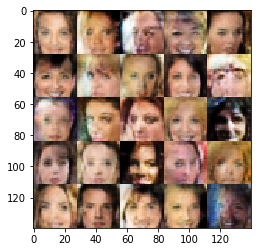

Epochs: 0/1. Discriminator Loss: 1.106 Generator Loss: 0.759
Epochs: 0/1. Discriminator Loss: 0.767 Generator Loss: 1.475
Epochs: 0/1. Discriminator Loss: 1.277 Generator Loss: 0.561
Epochs: 0/1. Discriminator Loss: 0.909 Generator Loss: 1.203
Epochs: 0/1. Discriminator Loss: 0.939 Generator Loss: 0.91
Epochs: 0/1. Discriminator Loss: 0.924 Generator Loss: 1.238
Epochs: 0/1. Discriminator Loss: 0.832 Generator Loss: 1.116
Epochs: 0/1. Discriminator Loss: 0.949 Generator Loss: 0.931
Epochs: 0/1. Discriminator Loss: 0.666 Generator Loss: 1.939
Epochs: 0/1. Discriminator Loss: 2.285 Generator Loss: 0.191


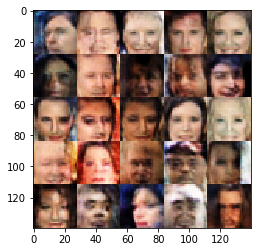

Epochs: 0/1. Discriminator Loss: 1.108 Generator Loss: 0.691
Epochs: 0/1. Discriminator Loss: 1.311 Generator Loss: 0.531
Epochs: 0/1. Discriminator Loss: 1.325 Generator Loss: 0.52
Epochs: 0/1. Discriminator Loss: 0.556 Generator Loss: 1.892
Epochs: 0/1. Discriminator Loss: 0.712 Generator Loss: 1.835
Epochs: 0/1. Discriminator Loss: 0.741 Generator Loss: 1.26
Epochs: 0/1. Discriminator Loss: 1.49 Generator Loss: 2.358
Epochs: 0/1. Discriminator Loss: 1.423 Generator Loss: 0.48
Epochs: 0/1. Discriminator Loss: 0.99 Generator Loss: 1.485
Epochs: 0/1. Discriminator Loss: 0.744 Generator Loss: 1.957


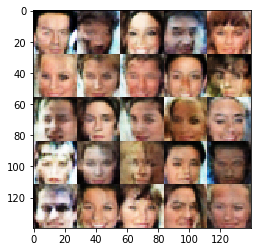

Epochs: 0/1. Discriminator Loss: 0.81 Generator Loss: 2.209
Epochs: 0/1. Discriminator Loss: 1.035 Generator Loss: 0.873
Epochs: 0/1. Discriminator Loss: 1.362 Generator Loss: 0.504
Epochs: 0/1. Discriminator Loss: 1.065 Generator Loss: 0.865
Epochs: 0/1. Discriminator Loss: 0.949 Generator Loss: 1.162
Epochs: 0/1. Discriminator Loss: 0.774 Generator Loss: 1.135
Epochs: 0/1. Discriminator Loss: 1.123 Generator Loss: 0.737
Epochs: 0/1. Discriminator Loss: 0.818 Generator Loss: 1.87
Epochs: 0/1. Discriminator Loss: 1.139 Generator Loss: 0.7
Epochs: 0/1. Discriminator Loss: 1.177 Generator Loss: 0.634


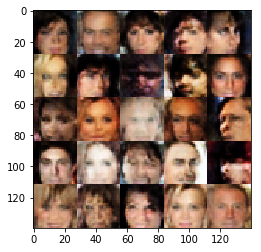

Epochs: 0/1. Discriminator Loss: 0.977 Generator Loss: 0.994
Epochs: 0/1. Discriminator Loss: 1.079 Generator Loss: 0.939
Epochs: 0/1. Discriminator Loss: 1.107 Generator Loss: 0.75
Epochs: 0/1. Discriminator Loss: 1.377 Generator Loss: 0.526
Epochs: 0/1. Discriminator Loss: 0.825 Generator Loss: 1.487
Epochs: 0/1. Discriminator Loss: 1.064 Generator Loss: 0.766
Epochs: 0/1. Discriminator Loss: 1.01 Generator Loss: 0.96
Epochs: 0/1. Discriminator Loss: 0.809 Generator Loss: 1.217
Epochs: 0/1. Discriminator Loss: 0.683 Generator Loss: 1.376
Epochs: 0/1. Discriminator Loss: 0.992 Generator Loss: 0.895


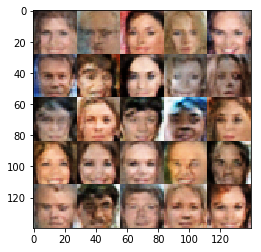

Epochs: 0/1. Discriminator Loss: 1.189 Generator Loss: 0.72
Epochs: 0/1. Discriminator Loss: 1.155 Generator Loss: 0.667
Epochs: 0/1. Discriminator Loss: 1.107 Generator Loss: 0.782
Epochs: 0/1. Discriminator Loss: 1.319 Generator Loss: 0.718
Epochs: 0/1. Discriminator Loss: 0.933 Generator Loss: 1.251
Epochs: 0/1. Discriminator Loss: 1.028 Generator Loss: 1.319
Epochs: 0/1. Discriminator Loss: 0.754 Generator Loss: 1.202
Epochs: 0/1. Discriminator Loss: 0.912 Generator Loss: 1.956
Epochs: 0/1. Discriminator Loss: 0.934 Generator Loss: 0.9
Epochs: 0/1. Discriminator Loss: 0.935 Generator Loss: 0.863


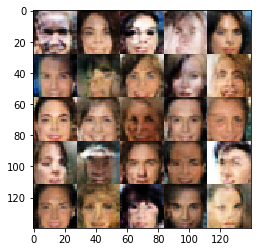

Epochs: 0/1. Discriminator Loss: 0.797 Generator Loss: 1.312
Epochs: 0/1. Discriminator Loss: 1.252 Generator Loss: 0.58
Epochs: 0/1. Discriminator Loss: 1.252 Generator Loss: 1.459
Epochs: 0/1. Discriminator Loss: 1.165 Generator Loss: 0.811
Epochs: 0/1. Discriminator Loss: 0.627 Generator Loss: 1.86
Epochs: 0/1. Discriminator Loss: 1.139 Generator Loss: 0.851
Epochs: 0/1. Discriminator Loss: 0.831 Generator Loss: 1.145
Epochs: 0/1. Discriminator Loss: 1.515 Generator Loss: 0.451
Epochs: 0/1. Discriminator Loss: 0.963 Generator Loss: 0.902
Epochs: 0/1. Discriminator Loss: 0.987 Generator Loss: 0.845


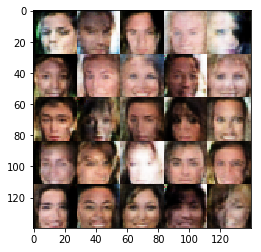

Epochs: 0/1. Discriminator Loss: 0.935 Generator Loss: 1.183
Epochs: 0/1. Discriminator Loss: 1.167 Generator Loss: 0.801
Epochs: 0/1. Discriminator Loss: 0.672 Generator Loss: 1.587
Epochs: 0/1. Discriminator Loss: 0.829 Generator Loss: 1.114
Epochs: 0/1. Discriminator Loss: 1.253 Generator Loss: 0.573
Epochs: 0/1. Discriminator Loss: 0.984 Generator Loss: 1.173
Epochs: 0/1. Discriminator Loss: 1.018 Generator Loss: 1.095
Epochs: 0/1. Discriminator Loss: 0.944 Generator Loss: 0.979
Epochs: 0/1. Discriminator Loss: 1.055 Generator Loss: 0.956
Epochs: 0/1. Discriminator Loss: 1.149 Generator Loss: 1.606


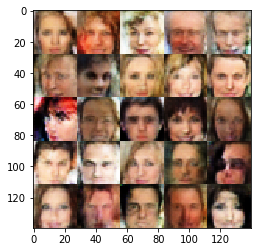

Epochs: 0/1. Discriminator Loss: 1.586 Generator Loss: 0.404
Epochs: 0/1. Discriminator Loss: 0.993 Generator Loss: 1.275
Epochs: 0/1. Discriminator Loss: 0.757 Generator Loss: 1.507
Epochs: 0/1. Discriminator Loss: 1.07 Generator Loss: 1.229
Epochs: 0/1. Discriminator Loss: 0.905 Generator Loss: 0.958
Epochs: 0/1. Discriminator Loss: 0.956 Generator Loss: 1.196
Epochs: 0/1. Discriminator Loss: 0.939 Generator Loss: 1.644
Epochs: 0/1. Discriminator Loss: 0.931 Generator Loss: 1.161
Epochs: 0/1. Discriminator Loss: 1.17 Generator Loss: 0.73
Epochs: 0/1. Discriminator Loss: 0.935 Generator Loss: 1.385


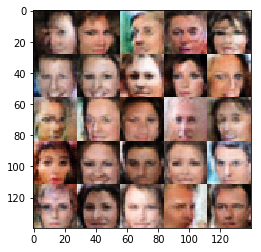

Epochs: 0/1. Discriminator Loss: 0.887 Generator Loss: 1.156
Epochs: 0/1. Discriminator Loss: 1.969 Generator Loss: 2.967
Epochs: 0/1. Discriminator Loss: 1.163 Generator Loss: 0.68
Epochs: 0/1. Discriminator Loss: 1.019 Generator Loss: 0.799
Epochs: 0/1. Discriminator Loss: 0.881 Generator Loss: 1.1
Epochs: 0/1. Discriminator Loss: 1.492 Generator Loss: 0.434
Epochs: 0/1. Discriminator Loss: 1.215 Generator Loss: 0.585
Epochs: 0/1. Discriminator Loss: 1.328 Generator Loss: 0.534
Epochs: 0/1. Discriminator Loss: 0.883 Generator Loss: 1.245
Epochs: 0/1. Discriminator Loss: 0.903 Generator Loss: 1.894


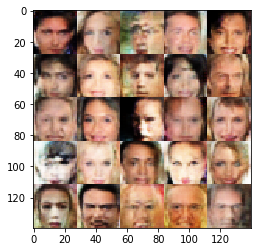

Epochs: 0/1. Discriminator Loss: 1.178 Generator Loss: 0.67
Epochs: 0/1. Discriminator Loss: 0.54 Generator Loss: 1.965
Epochs: 0/1. Discriminator Loss: 1.199 Generator Loss: 0.628
Epochs: 0/1. Discriminator Loss: 1.098 Generator Loss: 0.849
Epochs: 0/1. Discriminator Loss: 1.291 Generator Loss: 0.596
Epochs: 0/1. Discriminator Loss: 1.388 Generator Loss: 0.522
Epochs: 0/1. Discriminator Loss: 1.054 Generator Loss: 1.01
Epochs: 0/1. Discriminator Loss: 0.85 Generator Loss: 1.604
Epochs: 0/1. Discriminator Loss: 1.243 Generator Loss: 0.626
Epochs: 0/1. Discriminator Loss: 0.892 Generator Loss: 1.91


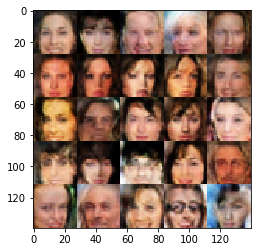

Epochs: 0/1. Discriminator Loss: 0.8 Generator Loss: 1.262
Epochs: 0/1. Discriminator Loss: 0.887 Generator Loss: 1.546
Epochs: 0/1. Discriminator Loss: 1.309 Generator Loss: 1.288
Epochs: 0/1. Discriminator Loss: 0.956 Generator Loss: 1.212
Epochs: 0/1. Discriminator Loss: 0.686 Generator Loss: 1.932
Epochs: 0/1. Discriminator Loss: 1.607 Generator Loss: 0.381
Epochs: 0/1. Discriminator Loss: 0.706 Generator Loss: 1.328
Epochs: 0/1. Discriminator Loss: 0.895 Generator Loss: 1.34
Epochs: 0/1. Discriminator Loss: 0.968 Generator Loss: 0.912
Epochs: 0/1. Discriminator Loss: 1.39 Generator Loss: 0.476


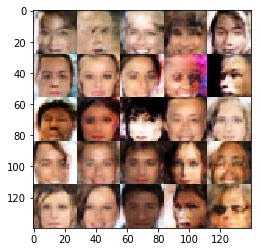

Epochs: 0/1. Discriminator Loss: 0.652 Generator Loss: 1.499
Epochs: 0/1. Discriminator Loss: 1.044 Generator Loss: 0.959
Epochs: 0/1. Discriminator Loss: 1.523 Generator Loss: 0.408
Epochs: 0/1. Discriminator Loss: 1.19 Generator Loss: 0.856
Epochs: 0/1. Discriminator Loss: 0.684 Generator Loss: 1.649
Epochs: 0/1. Discriminator Loss: 1.069 Generator Loss: 0.786
Epochs: 0/1. Discriminator Loss: 0.642 Generator Loss: 1.459
Epochs: 0/1. Discriminator Loss: 0.905 Generator Loss: 2.438
Epochs: 0/1. Discriminator Loss: 1.075 Generator Loss: 0.708
Epochs: 0/1. Discriminator Loss: 1.01 Generator Loss: 1.16


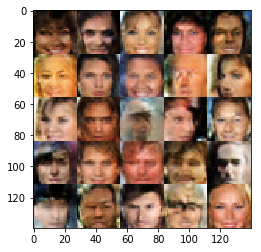

Epochs: 0/1. Discriminator Loss: 0.93 Generator Loss: 1.079
Epochs: 0/1. Discriminator Loss: 1.166 Generator Loss: 0.734
Epochs: 0/1. Discriminator Loss: 0.74 Generator Loss: 1.501
Epochs: 1/1. Discriminator Loss: 0.888 Generator Loss: 1.354
Epochs: 1/1. Discriminator Loss: 0.866 Generator Loss: 1.836
Epochs: 1/1. Discriminator Loss: 0.99 Generator Loss: 0.914
Epochs: 1/1. Discriminator Loss: 1.153 Generator Loss: 0.673
Epochs: 1/1. Discriminator Loss: 0.71 Generator Loss: 1.535
Epochs: 1/1. Discriminator Loss: 0.911 Generator Loss: 1.363
Epochs: 1/1. Discriminator Loss: 1.373 Generator Loss: 0.477


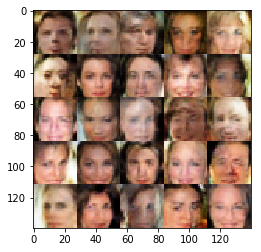

Epochs: 1/1. Discriminator Loss: 1.179 Generator Loss: 0.704
Epochs: 1/1. Discriminator Loss: 1.125 Generator Loss: 0.766
Epochs: 1/1. Discriminator Loss: 0.958 Generator Loss: 1.329
Epochs: 1/1. Discriminator Loss: 1.129 Generator Loss: 0.799
Epochs: 1/1. Discriminator Loss: 0.738 Generator Loss: 1.899
Epochs: 1/1. Discriminator Loss: 1.121 Generator Loss: 0.942
Epochs: 1/1. Discriminator Loss: 0.891 Generator Loss: 1.658
Epochs: 1/1. Discriminator Loss: 1.031 Generator Loss: 0.812
Epochs: 1/1. Discriminator Loss: 1.242 Generator Loss: 0.599
Epochs: 1/1. Discriminator Loss: 0.962 Generator Loss: 1.242


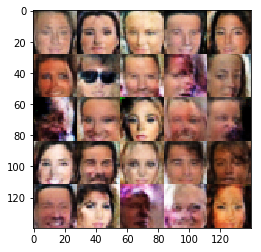

Epochs: 1/1. Discriminator Loss: 0.973 Generator Loss: 1.955
Epochs: 1/1. Discriminator Loss: 0.773 Generator Loss: 1.331
Epochs: 1/1. Discriminator Loss: 0.676 Generator Loss: 1.535
Epochs: 1/1. Discriminator Loss: 0.876 Generator Loss: 0.947
Epochs: 1/1. Discriminator Loss: 0.799 Generator Loss: 1.394
Epochs: 1/1. Discriminator Loss: 0.824 Generator Loss: 1.072
Epochs: 1/1. Discriminator Loss: 1.198 Generator Loss: 0.656
Epochs: 1/1. Discriminator Loss: 0.924 Generator Loss: 0.9
Epochs: 1/1. Discriminator Loss: 0.971 Generator Loss: 0.982
Epochs: 1/1. Discriminator Loss: 1.182 Generator Loss: 0.62


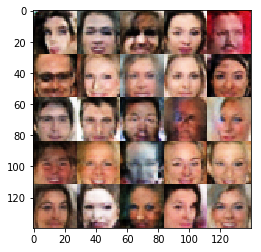

Epochs: 1/1. Discriminator Loss: 0.888 Generator Loss: 0.973
Epochs: 1/1. Discriminator Loss: 1.619 Generator Loss: 0.357
Epochs: 1/1. Discriminator Loss: 2.112 Generator Loss: 0.225
Epochs: 1/1. Discriminator Loss: 0.792 Generator Loss: 1.22
Epochs: 1/1. Discriminator Loss: 1.158 Generator Loss: 0.713
Epochs: 1/1. Discriminator Loss: 1.191 Generator Loss: 0.672
Epochs: 1/1. Discriminator Loss: 1.129 Generator Loss: 0.763
Epochs: 1/1. Discriminator Loss: 1.166 Generator Loss: 0.703
Epochs: 1/1. Discriminator Loss: 1.047 Generator Loss: 0.778
Epochs: 1/1. Discriminator Loss: 0.95 Generator Loss: 1.116


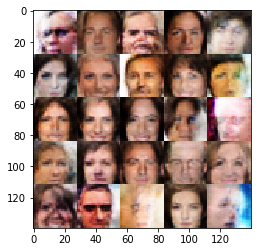

Epochs: 1/1. Discriminator Loss: 1.392 Generator Loss: 0.494
Epochs: 1/1. Discriminator Loss: 1.298 Generator Loss: 0.52
Epochs: 1/1. Discriminator Loss: 1.195 Generator Loss: 0.655
Epochs: 1/1. Discriminator Loss: 1.091 Generator Loss: 0.745
Epochs: 1/1. Discriminator Loss: 1.158 Generator Loss: 0.623
Epochs: 1/1. Discriminator Loss: 1.177 Generator Loss: 0.647
Epochs: 1/1. Discriminator Loss: 1.248 Generator Loss: 0.624
Epochs: 1/1. Discriminator Loss: 1.216 Generator Loss: 0.632
Epochs: 1/1. Discriminator Loss: 1.308 Generator Loss: 0.544
Epochs: 1/1. Discriminator Loss: 0.921 Generator Loss: 1.076


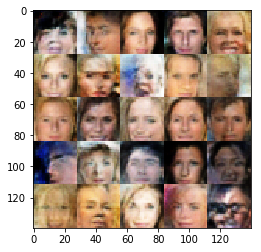

Epochs: 1/1. Discriminator Loss: 1.039 Generator Loss: 0.855
Epochs: 1/1. Discriminator Loss: 1.564 Generator Loss: 0.402
Epochs: 1/1. Discriminator Loss: 1.033 Generator Loss: 0.778
Epochs: 1/1. Discriminator Loss: 1.121 Generator Loss: 0.749
Epochs: 1/1. Discriminator Loss: 1.398 Generator Loss: 0.453
Epochs: 1/1. Discriminator Loss: 1.175 Generator Loss: 0.849
Epochs: 1/1. Discriminator Loss: 1.155 Generator Loss: 0.967
Epochs: 1/1. Discriminator Loss: 1.704 Generator Loss: 0.335
Epochs: 1/1. Discriminator Loss: 0.996 Generator Loss: 1.131
Epochs: 1/1. Discriminator Loss: 1.173 Generator Loss: 0.725


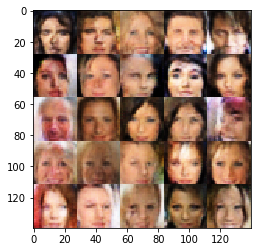

Epochs: 1/1. Discriminator Loss: 1.079 Generator Loss: 0.766
Epochs: 1/1. Discriminator Loss: 0.987 Generator Loss: 1.267
Epochs: 1/1. Discriminator Loss: 0.974 Generator Loss: 1.108
Epochs: 1/1. Discriminator Loss: 0.903 Generator Loss: 1.059
Epochs: 1/1. Discriminator Loss: 1.112 Generator Loss: 0.808
Epochs: 1/1. Discriminator Loss: 0.937 Generator Loss: 1.084
Epochs: 1/1. Discriminator Loss: 1.121 Generator Loss: 0.728
Epochs: 1/1. Discriminator Loss: 0.834 Generator Loss: 1.125
Epochs: 1/1. Discriminator Loss: 0.93 Generator Loss: 1.08
Epochs: 1/1. Discriminator Loss: 0.942 Generator Loss: 0.921


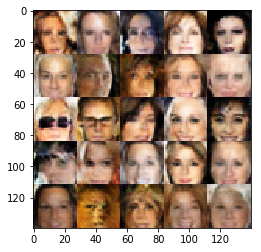

Epochs: 1/1. Discriminator Loss: 0.98 Generator Loss: 1.107
Epochs: 1/1. Discriminator Loss: 0.917 Generator Loss: 1.358
Epochs: 1/1. Discriminator Loss: 1.158 Generator Loss: 0.663
Epochs: 1/1. Discriminator Loss: 0.933 Generator Loss: 0.927
Epochs: 1/1. Discriminator Loss: 1.033 Generator Loss: 0.82
Epochs: 1/1. Discriminator Loss: 0.71 Generator Loss: 1.32
Epochs: 1/1. Discriminator Loss: 0.646 Generator Loss: 1.739
Epochs: 1/1. Discriminator Loss: 0.948 Generator Loss: 1.002
Epochs: 1/1. Discriminator Loss: 1.001 Generator Loss: 0.923
Epochs: 1/1. Discriminator Loss: 0.734 Generator Loss: 1.406


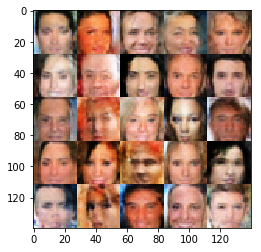

Epochs: 1/1. Discriminator Loss: 0.88 Generator Loss: 1.484
Epochs: 1/1. Discriminator Loss: 0.956 Generator Loss: 1.059
Epochs: 1/1. Discriminator Loss: 0.648 Generator Loss: 1.515
Epochs: 1/1. Discriminator Loss: 1.28 Generator Loss: 0.582
Epochs: 1/1. Discriminator Loss: 1.038 Generator Loss: 1.012
Epochs: 1/1. Discriminator Loss: 1.266 Generator Loss: 0.583
Epochs: 1/1. Discriminator Loss: 1.259 Generator Loss: 0.585
Epochs: 1/1. Discriminator Loss: 0.963 Generator Loss: 1.04
Epochs: 1/1. Discriminator Loss: 0.764 Generator Loss: 1.183
Epochs: 1/1. Discriminator Loss: 1.144 Generator Loss: 0.637


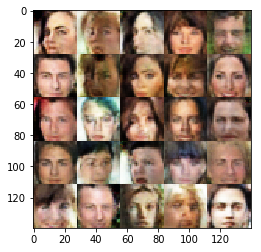

Epochs: 1/1. Discriminator Loss: 1.11 Generator Loss: 1.499
Epochs: 1/1. Discriminator Loss: 1.0 Generator Loss: 1.237
Epochs: 1/1. Discriminator Loss: 0.813 Generator Loss: 1.105
Epochs: 1/1. Discriminator Loss: 0.917 Generator Loss: 1.429
Epochs: 1/1. Discriminator Loss: 1.003 Generator Loss: 0.873
Epochs: 1/1. Discriminator Loss: 0.972 Generator Loss: 0.926
Epochs: 1/1. Discriminator Loss: 0.929 Generator Loss: 1.188
Epochs: 1/1. Discriminator Loss: 1.611 Generator Loss: 0.363
Epochs: 1/1. Discriminator Loss: 1.204 Generator Loss: 0.683
Epochs: 1/1. Discriminator Loss: 1.392 Generator Loss: 0.495


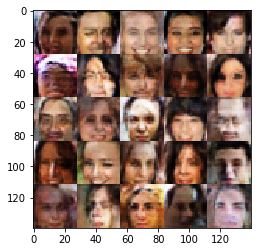

Epochs: 1/1. Discriminator Loss: 0.905 Generator Loss: 1.303
Epochs: 1/1. Discriminator Loss: 0.711 Generator Loss: 1.36
Epochs: 1/1. Discriminator Loss: 0.803 Generator Loss: 1.154
Epochs: 1/1. Discriminator Loss: 1.063 Generator Loss: 0.886
Epochs: 1/1. Discriminator Loss: 0.959 Generator Loss: 0.964
Epochs: 1/1. Discriminator Loss: 0.965 Generator Loss: 1.163
Epochs: 1/1. Discriminator Loss: 0.706 Generator Loss: 1.495
Epochs: 1/1. Discriminator Loss: 0.637 Generator Loss: 1.928
Epochs: 1/1. Discriminator Loss: 0.943 Generator Loss: 1.016
Epochs: 1/1. Discriminator Loss: 1.228 Generator Loss: 0.634


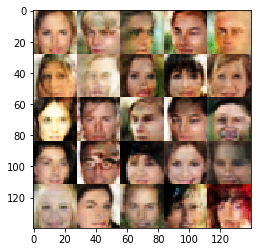

Epochs: 1/1. Discriminator Loss: 0.707 Generator Loss: 2.284
Epochs: 1/1. Discriminator Loss: 0.873 Generator Loss: 1.074
Epochs: 1/1. Discriminator Loss: 1.482 Generator Loss: 0.441
Epochs: 1/1. Discriminator Loss: 0.945 Generator Loss: 1.194
Epochs: 1/1. Discriminator Loss: 0.906 Generator Loss: 1.025
Epochs: 1/1. Discriminator Loss: 1.277 Generator Loss: 0.672
Epochs: 1/1. Discriminator Loss: 1.05 Generator Loss: 0.884
Epochs: 1/1. Discriminator Loss: 1.248 Generator Loss: 0.694
Epochs: 1/1. Discriminator Loss: 1.006 Generator Loss: 0.822
Epochs: 1/1. Discriminator Loss: 0.961 Generator Loss: 1.065


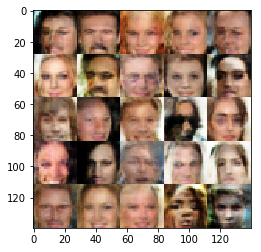

Epochs: 1/1. Discriminator Loss: 1.1 Generator Loss: 0.864
Epochs: 1/1. Discriminator Loss: 1.111 Generator Loss: 0.767
Epochs: 1/1. Discriminator Loss: 1.396 Generator Loss: 0.482
Epochs: 1/1. Discriminator Loss: 1.166 Generator Loss: 0.708
Epochs: 1/1. Discriminator Loss: 1.156 Generator Loss: 0.693
Epochs: 1/1. Discriminator Loss: 1.413 Generator Loss: 0.533
Epochs: 1/1. Discriminator Loss: 1.022 Generator Loss: 0.995
Epochs: 1/1. Discriminator Loss: 1.029 Generator Loss: 0.847
Epochs: 1/1. Discriminator Loss: 1.077 Generator Loss: 0.804
Epochs: 1/1. Discriminator Loss: 1.295 Generator Loss: 1.837


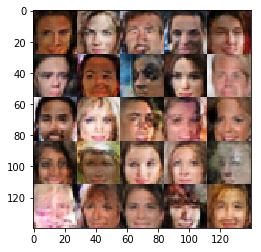

Epochs: 1/1. Discriminator Loss: 1.266 Generator Loss: 0.634
Epochs: 1/1. Discriminator Loss: 1.147 Generator Loss: 0.804
Epochs: 1/1. Discriminator Loss: 1.155 Generator Loss: 0.669
Epochs: 1/1. Discriminator Loss: 1.089 Generator Loss: 0.797
Epochs: 1/1. Discriminator Loss: 1.118 Generator Loss: 0.718
Epochs: 1/1. Discriminator Loss: 1.085 Generator Loss: 0.715
Epochs: 1/1. Discriminator Loss: 0.786 Generator Loss: 1.619
Epochs: 1/1. Discriminator Loss: 1.326 Generator Loss: 0.539
Epochs: 1/1. Discriminator Loss: 1.044 Generator Loss: 0.848
Epochs: 1/1. Discriminator Loss: 0.996 Generator Loss: 1.093


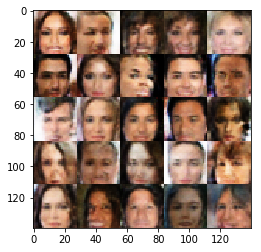

Epochs: 1/1. Discriminator Loss: 0.702 Generator Loss: 1.548
Epochs: 1/1. Discriminator Loss: 1.25 Generator Loss: 0.647
Epochs: 1/1. Discriminator Loss: 1.147 Generator Loss: 0.685
Epochs: 1/1. Discriminator Loss: 0.919 Generator Loss: 0.966
Epochs: 1/1. Discriminator Loss: 1.276 Generator Loss: 0.566
Epochs: 1/1. Discriminator Loss: 1.181 Generator Loss: 0.626
Epochs: 1/1. Discriminator Loss: 0.86 Generator Loss: 1.056
Epochs: 1/1. Discriminator Loss: 1.142 Generator Loss: 1.087
Epochs: 1/1. Discriminator Loss: 1.032 Generator Loss: 1.833
Epochs: 1/1. Discriminator Loss: 0.825 Generator Loss: 1.082


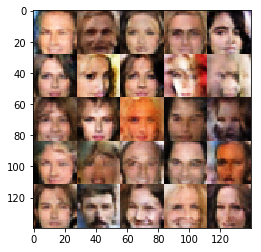

Epochs: 1/1. Discriminator Loss: 1.026 Generator Loss: 1.274
Epochs: 1/1. Discriminator Loss: 0.514 Generator Loss: 2.091
Epochs: 1/1. Discriminator Loss: 1.106 Generator Loss: 0.752
Epochs: 1/1. Discriminator Loss: 0.981 Generator Loss: 0.928
Epochs: 1/1. Discriminator Loss: 1.449 Generator Loss: 0.521
Epochs: 1/1. Discriminator Loss: 1.104 Generator Loss: 1.542
Epochs: 1/1. Discriminator Loss: 0.866 Generator Loss: 1.282
Epochs: 1/1. Discriminator Loss: 0.905 Generator Loss: 0.999
Epochs: 1/1. Discriminator Loss: 1.397 Generator Loss: 0.459
Epochs: 1/1. Discriminator Loss: 0.951 Generator Loss: 0.91


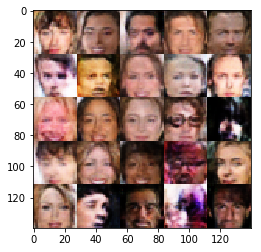

Epochs: 1/1. Discriminator Loss: 1.007 Generator Loss: 0.897
Epochs: 1/1. Discriminator Loss: 1.345 Generator Loss: 0.655
Epochs: 1/1. Discriminator Loss: 0.784 Generator Loss: 1.347
Epochs: 1/1. Discriminator Loss: 1.014 Generator Loss: 1.17
Epochs: 1/1. Discriminator Loss: 1.281 Generator Loss: 0.552
Epochs: 1/1. Discriminator Loss: 1.23 Generator Loss: 0.746
Epochs: 1/1. Discriminator Loss: 1.045 Generator Loss: 0.754
Epochs: 1/1. Discriminator Loss: 0.964 Generator Loss: 1.031
Epochs: 1/1. Discriminator Loss: 1.078 Generator Loss: 0.802
Epochs: 1/1. Discriminator Loss: 1.48 Generator Loss: 0.438


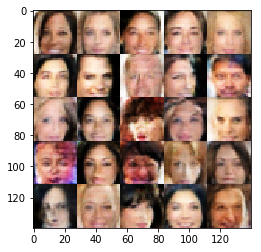

Epochs: 1/1. Discriminator Loss: 1.357 Generator Loss: 0.541
Epochs: 1/1. Discriminator Loss: 0.812 Generator Loss: 1.161
Epochs: 1/1. Discriminator Loss: 1.118 Generator Loss: 0.875
Epochs: 1/1. Discriminator Loss: 0.992 Generator Loss: 0.962
Epochs: 1/1. Discriminator Loss: 1.148 Generator Loss: 0.655
Epochs: 1/1. Discriminator Loss: 1.174 Generator Loss: 0.659
Epochs: 1/1. Discriminator Loss: 1.119 Generator Loss: 1.237
Epochs: 1/1. Discriminator Loss: 0.728 Generator Loss: 1.335
Epochs: 1/1. Discriminator Loss: 1.11 Generator Loss: 0.776
Epochs: 1/1. Discriminator Loss: 0.941 Generator Loss: 1.12


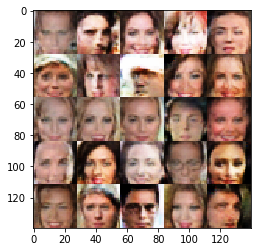

Epochs: 1/1. Discriminator Loss: 0.899 Generator Loss: 1.229
Epochs: 1/1. Discriminator Loss: 1.074 Generator Loss: 0.893
Epochs: 1/1. Discriminator Loss: 1.358 Generator Loss: 0.501
Epochs: 1/1. Discriminator Loss: 1.051 Generator Loss: 0.765
Epochs: 1/1. Discriminator Loss: 1.037 Generator Loss: 0.911
Epochs: 1/1. Discriminator Loss: 1.184 Generator Loss: 0.726
Epochs: 1/1. Discriminator Loss: 1.22 Generator Loss: 0.607
Epochs: 1/1. Discriminator Loss: 0.881 Generator Loss: 1.13
Epochs: 1/1. Discriminator Loss: 1.327 Generator Loss: 0.523
Epochs: 1/1. Discriminator Loss: 1.323 Generator Loss: 0.505


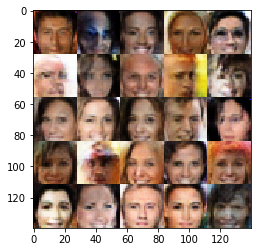

Epochs: 1/1. Discriminator Loss: 1.04 Generator Loss: 0.87
Epochs: 1/1. Discriminator Loss: 0.901 Generator Loss: 0.999
Epochs: 1/1. Discriminator Loss: 0.777 Generator Loss: 1.18
Epochs: 1/1. Discriminator Loss: 1.191 Generator Loss: 0.632
Epochs: 1/1. Discriminator Loss: 1.446 Generator Loss: 0.463
Epochs: 1/1. Discriminator Loss: 0.873 Generator Loss: 1.119
Epochs: 1/1. Discriminator Loss: 0.95 Generator Loss: 1.301
Epochs: 1/1. Discriminator Loss: 1.185 Generator Loss: 0.628
Epochs: 1/1. Discriminator Loss: 0.969 Generator Loss: 0.951
Epochs: 1/1. Discriminator Loss: 0.855 Generator Loss: 1.073


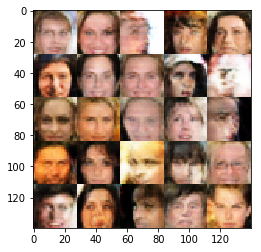

Epochs: 1/1. Discriminator Loss: 0.823 Generator Loss: 1.168
Epochs: 1/1. Discriminator Loss: 1.342 Generator Loss: 0.528
Epochs: 1/1. Discriminator Loss: 0.976 Generator Loss: 0.837
Epochs: 1/1. Discriminator Loss: 0.981 Generator Loss: 0.97
Epochs: 1/1. Discriminator Loss: 0.991 Generator Loss: 1.122
Epochs: 1/1. Discriminator Loss: 1.269 Generator Loss: 0.584
Epochs: 1/1. Discriminator Loss: 0.748 Generator Loss: 1.445
Epochs: 1/1. Discriminator Loss: 1.189 Generator Loss: 0.706
Epochs: 1/1. Discriminator Loss: 0.636 Generator Loss: 2.755
Epochs: 1/1. Discriminator Loss: 0.81 Generator Loss: 1.321


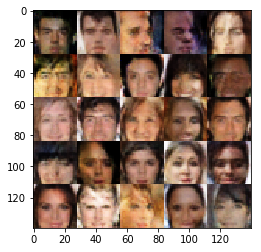

Epochs: 1/1. Discriminator Loss: 1.355 Generator Loss: 0.526
Epochs: 1/1. Discriminator Loss: 0.958 Generator Loss: 0.991
Epochs: 1/1. Discriminator Loss: 1.616 Generator Loss: 0.367
Epochs: 1/1. Discriminator Loss: 0.91 Generator Loss: 1.567
Epochs: 1/1. Discriminator Loss: 0.881 Generator Loss: 1.156
Epochs: 1/1. Discriminator Loss: 1.185 Generator Loss: 0.642
Epochs: 1/1. Discriminator Loss: 1.307 Generator Loss: 0.535
Epochs: 1/1. Discriminator Loss: 1.015 Generator Loss: 0.887
Epochs: 1/1. Discriminator Loss: 0.85 Generator Loss: 1.041
Epochs: 1/1. Discriminator Loss: 1.376 Generator Loss: 0.518


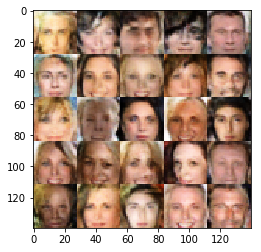

Epochs: 1/1. Discriminator Loss: 1.562 Generator Loss: 0.41
Epochs: 1/1. Discriminator Loss: 1.066 Generator Loss: 0.765
Epochs: 1/1. Discriminator Loss: 0.917 Generator Loss: 1.014
Epochs: 1/1. Discriminator Loss: 0.788 Generator Loss: 1.238
Epochs: 1/1. Discriminator Loss: 0.979 Generator Loss: 0.829
Epochs: 1/1. Discriminator Loss: 1.053 Generator Loss: 1.393
Epochs: 1/1. Discriminator Loss: 1.32 Generator Loss: 0.561
Epochs: 1/1. Discriminator Loss: 1.148 Generator Loss: 0.719
Epochs: 1/1. Discriminator Loss: 0.746 Generator Loss: 1.702
Epochs: 1/1. Discriminator Loss: 0.717 Generator Loss: 2.113


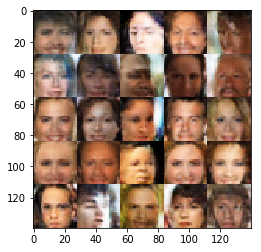

Epochs: 1/1. Discriminator Loss: 1.027 Generator Loss: 0.904
Epochs: 1/1. Discriminator Loss: 0.799 Generator Loss: 1.447
Epochs: 1/1. Discriminator Loss: 1.162 Generator Loss: 0.725
Epochs: 1/1. Discriminator Loss: 1.019 Generator Loss: 1.285
Epochs: 1/1. Discriminator Loss: 1.237 Generator Loss: 0.591
Epochs: 1/1. Discriminator Loss: 1.117 Generator Loss: 0.756
Epochs: 1/1. Discriminator Loss: 0.947 Generator Loss: 1.007
Epochs: 1/1. Discriminator Loss: 1.017 Generator Loss: 1.022
Epochs: 1/1. Discriminator Loss: 1.146 Generator Loss: 0.793
Epochs: 1/1. Discriminator Loss: 0.74 Generator Loss: 1.814


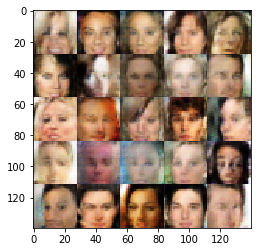

Epochs: 1/1. Discriminator Loss: 1.002 Generator Loss: 1.169
Epochs: 1/1. Discriminator Loss: 1.009 Generator Loss: 1.254
Epochs: 1/1. Discriminator Loss: 1.026 Generator Loss: 1.225
Epochs: 1/1. Discriminator Loss: 1.075 Generator Loss: 0.714
Epochs: 1/1. Discriminator Loss: 0.931 Generator Loss: 1.397
Epochs: 1/1. Discriminator Loss: 0.928 Generator Loss: 1.011
Epochs: 1/1. Discriminator Loss: 0.991 Generator Loss: 0.931
Epochs: 1/1. Discriminator Loss: 0.991 Generator Loss: 1.016
Epochs: 1/1. Discriminator Loss: 1.208 Generator Loss: 0.613
Epochs: 1/1. Discriminator Loss: 1.714 Generator Loss: 0.333


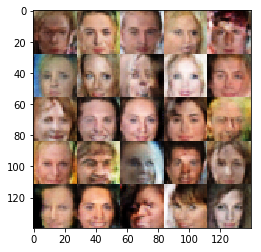

Epochs: 1/1. Discriminator Loss: 1.442 Generator Loss: 0.455
Epochs: 1/1. Discriminator Loss: 0.904 Generator Loss: 0.948
Epochs: 1/1. Discriminator Loss: 1.187 Generator Loss: 0.753
Epochs: 1/1. Discriminator Loss: 0.739 Generator Loss: 1.833
Epochs: 1/1. Discriminator Loss: 0.648 Generator Loss: 1.688
Epochs: 1/1. Discriminator Loss: 1.334 Generator Loss: 0.506
Epochs: 1/1. Discriminator Loss: 1.119 Generator Loss: 0.694
Epochs: 1/1. Discriminator Loss: 0.959 Generator Loss: 0.932
Epochs: 1/1. Discriminator Loss: 1.087 Generator Loss: 1.123
Epochs: 1/1. Discriminator Loss: 1.278 Generator Loss: 0.582


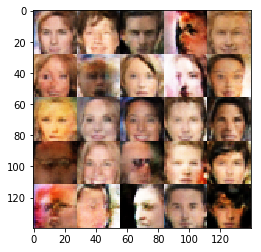

Epochs: 1/1. Discriminator Loss: 0.809 Generator Loss: 1.299
Epochs: 1/1. Discriminator Loss: 1.235 Generator Loss: 0.615
Epochs: 1/1. Discriminator Loss: 1.14 Generator Loss: 0.942
Epochs: 1/1. Discriminator Loss: 0.875 Generator Loss: 1.132
Epochs: 1/1. Discriminator Loss: 1.013 Generator Loss: 0.825
Epochs: 1/1. Discriminator Loss: 1.32 Generator Loss: 0.559
Epochs: 1/1. Discriminator Loss: 1.031 Generator Loss: 0.901
Epochs: 1/1. Discriminator Loss: 1.116 Generator Loss: 0.727
Epochs: 1/1. Discriminator Loss: 0.861 Generator Loss: 1.069
Epochs: 1/1. Discriminator Loss: 1.018 Generator Loss: 1.022


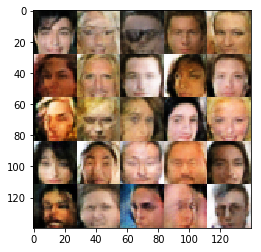

Epochs: 1/1. Discriminator Loss: 0.878 Generator Loss: 1.147
Epochs: 1/1. Discriminator Loss: 1.08 Generator Loss: 0.895
Epochs: 1/1. Discriminator Loss: 1.313 Generator Loss: 0.602
Epochs: 1/1. Discriminator Loss: 0.985 Generator Loss: 1.018
Epochs: 1/1. Discriminator Loss: 1.096 Generator Loss: 0.731
Epochs: 1/1. Discriminator Loss: 0.946 Generator Loss: 1.022
Epochs: 1/1. Discriminator Loss: 1.186 Generator Loss: 0.613
Epochs: 1/1. Discriminator Loss: 1.011 Generator Loss: 0.835
Epochs: 1/1. Discriminator Loss: 1.133 Generator Loss: 0.818
Epochs: 1/1. Discriminator Loss: 1.002 Generator Loss: 0.882


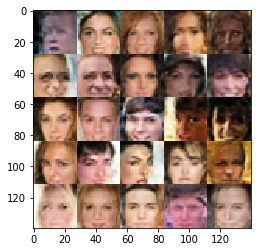

Epochs: 1/1. Discriminator Loss: 1.321 Generator Loss: 0.539
Epochs: 1/1. Discriminator Loss: 1.244 Generator Loss: 0.646
Epochs: 1/1. Discriminator Loss: 0.774 Generator Loss: 1.416
Epochs: 1/1. Discriminator Loss: 1.303 Generator Loss: 0.56
Epochs: 1/1. Discriminator Loss: 1.132 Generator Loss: 0.83
Epochs: 1/1. Discriminator Loss: 1.089 Generator Loss: 0.753
Epochs: 1/1. Discriminator Loss: 1.351 Generator Loss: 0.507
Epochs: 1/1. Discriminator Loss: 0.892 Generator Loss: 1.128
Epochs: 1/1. Discriminator Loss: 1.241 Generator Loss: 0.706
Epochs: 1/1. Discriminator Loss: 0.983 Generator Loss: 0.854


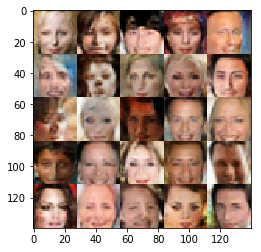

Epochs: 1/1. Discriminator Loss: 1.11 Generator Loss: 0.756
Epochs: 1/1. Discriminator Loss: 0.861 Generator Loss: 1.013
Epochs: 1/1. Discriminator Loss: 1.058 Generator Loss: 0.802
Epochs: 1/1. Discriminator Loss: 1.064 Generator Loss: 0.779
Epochs: 1/1. Discriminator Loss: 0.882 Generator Loss: 1.161
Epochs: 1/1. Discriminator Loss: 0.666 Generator Loss: 1.724
Epochs: 1/1. Discriminator Loss: 1.062 Generator Loss: 0.782
Epochs: 1/1. Discriminator Loss: 0.785 Generator Loss: 1.326
Epochs: 1/1. Discriminator Loss: 0.977 Generator Loss: 0.93
Epochs: 1/1. Discriminator Loss: 0.776 Generator Loss: 1.226


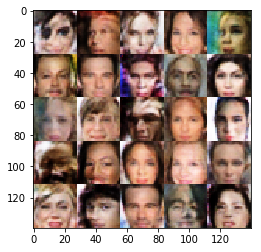

Epochs: 1/1. Discriminator Loss: 1.049 Generator Loss: 0.76
Epochs: 1/1. Discriminator Loss: 0.997 Generator Loss: 0.867
Epochs: 1/1. Discriminator Loss: 0.884 Generator Loss: 0.989
Epochs: 1/1. Discriminator Loss: 1.444 Generator Loss: 1.85
Epochs: 1/1. Discriminator Loss: 1.135 Generator Loss: 0.77
Epochs: 1/1. Discriminator Loss: 1.048 Generator Loss: 0.922
Epochs: 1/1. Discriminator Loss: 1.234 Generator Loss: 0.684
Epochs: 1/1. Discriminator Loss: 1.096 Generator Loss: 0.919
Epochs: 1/1. Discriminator Loss: 0.958 Generator Loss: 0.91
Epochs: 1/1. Discriminator Loss: 1.056 Generator Loss: 0.996


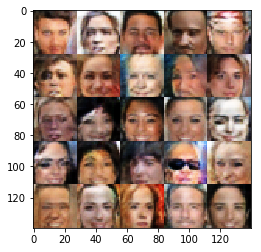

Epochs: 1/1. Discriminator Loss: 1.365 Generator Loss: 0.515
Epochs: 1/1. Discriminator Loss: 0.984 Generator Loss: 0.826
Epochs: 1/1. Discriminator Loss: 1.398 Generator Loss: 0.49
Epochs: 1/1. Discriminator Loss: 1.121 Generator Loss: 0.708
Epochs: 1/1. Discriminator Loss: 0.938 Generator Loss: 1.28
Epochs: 1/1. Discriminator Loss: 0.814 Generator Loss: 1.59
Epochs: 1/1. Discriminator Loss: 1.153 Generator Loss: 0.646
Epochs: 1/1. Discriminator Loss: 1.118 Generator Loss: 0.807
Epochs: 1/1. Discriminator Loss: 1.021 Generator Loss: 0.947
Epochs: 1/1. Discriminator Loss: 1.246 Generator Loss: 0.628


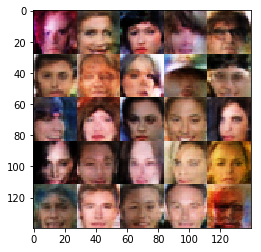

Epochs: 1/1. Discriminator Loss: 1.159 Generator Loss: 0.75
Epochs: 1/1. Discriminator Loss: 1.01 Generator Loss: 1.407
Epochs: 1/1. Discriminator Loss: 0.772 Generator Loss: 1.387
Epochs: 1/1. Discriminator Loss: 1.163 Generator Loss: 0.705
Epochs: 1/1. Discriminator Loss: 0.824 Generator Loss: 1.375
Epochs: 1/1. Discriminator Loss: 1.205 Generator Loss: 0.893
Epochs: 1/1. Discriminator Loss: 0.84 Generator Loss: 1.182
Epochs: 1/1. Discriminator Loss: 1.016 Generator Loss: 1.147
Epochs: 1/1. Discriminator Loss: 1.083 Generator Loss: 0.758
Epochs: 1/1. Discriminator Loss: 1.089 Generator Loss: 1.119


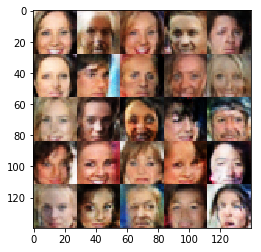

Epochs: 1/1. Discriminator Loss: 0.922 Generator Loss: 1.447
Epochs: 1/1. Discriminator Loss: 0.977 Generator Loss: 1.101
Epochs: 1/1. Discriminator Loss: 1.093 Generator Loss: 1.015
Epochs: 1/1. Discriminator Loss: 1.383 Generator Loss: 0.498
Epochs: 1/1. Discriminator Loss: 1.182 Generator Loss: 0.717
Epochs: 1/1. Discriminator Loss: 0.885 Generator Loss: 1.075
Epochs: 1/1. Discriminator Loss: 0.705 Generator Loss: 1.648
Epochs: 1/1. Discriminator Loss: 0.818 Generator Loss: 1.403
Epochs: 1/1. Discriminator Loss: 1.221 Generator Loss: 0.639
Epochs: 1/1. Discriminator Loss: 0.991 Generator Loss: 1.045


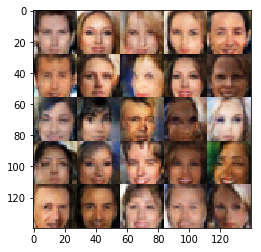

Epochs: 1/1. Discriminator Loss: 0.893 Generator Loss: 1.523
Epochs: 1/1. Discriminator Loss: 1.437 Generator Loss: 0.481
Epochs: 1/1. Discriminator Loss: 0.943 Generator Loss: 1.145
Epochs: 1/1. Discriminator Loss: 1.012 Generator Loss: 1.1
Epochs: 1/1. Discriminator Loss: 1.522 Generator Loss: 0.441
Epochs: 1/1. Discriminator Loss: 1.118 Generator Loss: 0.713
Epochs: 1/1. Discriminator Loss: 1.358 Generator Loss: 0.61
Epochs: 1/1. Discriminator Loss: 0.992 Generator Loss: 1.153
Epochs: 1/1. Discriminator Loss: 0.98 Generator Loss: 1.109
Epochs: 1/1. Discriminator Loss: 1.576 Generator Loss: 0.409


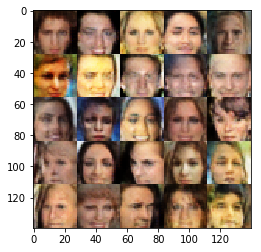

Epochs: 1/1. Discriminator Loss: 1.07 Generator Loss: 0.776
Epochs: 1/1. Discriminator Loss: 0.964 Generator Loss: 0.938
Epochs: 1/1. Discriminator Loss: 1.174 Generator Loss: 1.12
Epochs: 1/1. Discriminator Loss: 0.897 Generator Loss: 1.179
Epochs: 1/1. Discriminator Loss: 0.931 Generator Loss: 1.178
Epochs: 1/1. Discriminator Loss: 1.03 Generator Loss: 0.774
Epochs: 1/1. Discriminator Loss: 1.175 Generator Loss: 0.766
Epochs: 1/1. Discriminator Loss: 1.177 Generator Loss: 0.9
Epochs: 1/1. Discriminator Loss: 1.309 Generator Loss: 0.597
Epochs: 1/1. Discriminator Loss: 1.056 Generator Loss: 0.874


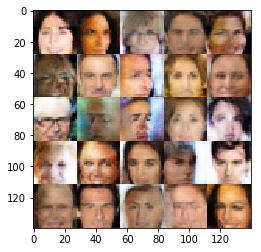

Epochs: 1/1. Discriminator Loss: 0.9 Generator Loss: 1.307
Epochs: 1/1. Discriminator Loss: 1.159 Generator Loss: 0.726
Epochs: 1/1. Discriminator Loss: 0.924 Generator Loss: 1.212
Epochs: 1/1. Discriminator Loss: 1.19 Generator Loss: 0.982
Epochs: 1/1. Discriminator Loss: 1.197 Generator Loss: 0.662
Epochs: 1/1. Discriminator Loss: 1.324 Generator Loss: 0.537
Epochs: 1/1. Discriminator Loss: 1.022 Generator Loss: 0.996
Epochs: 1/1. Discriminator Loss: 0.821 Generator Loss: 1.105
Epochs: 1/1. Discriminator Loss: 0.779 Generator Loss: 1.165
Epochs: 1/1. Discriminator Loss: 1.062 Generator Loss: 0.791


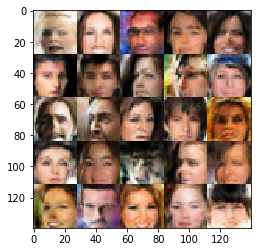

Epochs: 1/1. Discriminator Loss: 1.074 Generator Loss: 0.802
Epochs: 1/1. Discriminator Loss: 1.258 Generator Loss: 0.599
Epochs: 1/1. Discriminator Loss: 1.218 Generator Loss: 0.672
Epochs: 1/1. Discriminator Loss: 1.144 Generator Loss: 0.746
Epochs: 1/1. Discriminator Loss: 1.167 Generator Loss: 0.813
Epochs: 1/1. Discriminator Loss: 1.107 Generator Loss: 0.725
Epochs: 1/1. Discriminator Loss: 1.153 Generator Loss: 0.982
Epochs: 1/1. Discriminator Loss: 1.029 Generator Loss: 1.246
Epochs: 1/1. Discriminator Loss: 0.95 Generator Loss: 1.238
Epochs: 1/1. Discriminator Loss: 0.928 Generator Loss: 0.998


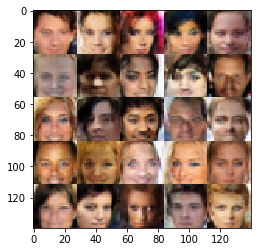

Epochs: 1/1. Discriminator Loss: 0.658 Generator Loss: 1.679
Epochs: 1/1. Discriminator Loss: 0.849 Generator Loss: 1.145
Epochs: 1/1. Discriminator Loss: 0.977 Generator Loss: 1.521
Epochs: 1/1. Discriminator Loss: 0.88 Generator Loss: 1.003
Epochs: 1/1. Discriminator Loss: 1.233 Generator Loss: 0.654
Epochs: 1/1. Discriminator Loss: 1.271 Generator Loss: 0.856
Epochs: 1/1. Discriminator Loss: 1.051 Generator Loss: 0.943
Epochs: 1/1. Discriminator Loss: 1.013 Generator Loss: 1.01
Epochs: 1/1. Discriminator Loss: 0.895 Generator Loss: 0.972
Epochs: 1/1. Discriminator Loss: 1.278 Generator Loss: 0.554


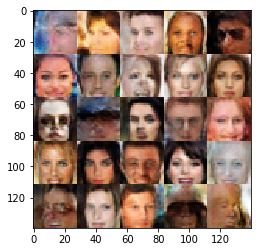

Epochs: 1/1. Discriminator Loss: 1.112 Generator Loss: 0.763
Epochs: 1/1. Discriminator Loss: 1.163 Generator Loss: 0.694
Epochs: 1/1. Discriminator Loss: 1.174 Generator Loss: 0.696
Epochs: 1/1. Discriminator Loss: 0.894 Generator Loss: 1.137
Epochs: 1/1. Discriminator Loss: 1.052 Generator Loss: 1.061
Epochs: 1/1. Discriminator Loss: 1.207 Generator Loss: 0.804
Epochs: 1/1. Discriminator Loss: 1.214 Generator Loss: 0.63
Epochs: 1/1. Discriminator Loss: 1.106 Generator Loss: 0.763
Epochs: 1/1. Discriminator Loss: 0.969 Generator Loss: 1.199
Epochs: 1/1. Discriminator Loss: 1.056 Generator Loss: 0.852


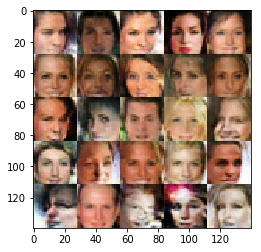

Epochs: 1/1. Discriminator Loss: 0.859 Generator Loss: 1.214
Epochs: 1/1. Discriminator Loss: 1.018 Generator Loss: 1.411
Epochs: 1/1. Discriminator Loss: 0.961 Generator Loss: 1.02
Epochs: 1/1. Discriminator Loss: 1.237 Generator Loss: 0.597
Epochs: 1/1. Discriminator Loss: 1.061 Generator Loss: 1.569
Epochs: 1/1. Discriminator Loss: 1.023 Generator Loss: 3.393
Epochs: 1/1. Discriminator Loss: 1.409 Generator Loss: 0.525
Epochs: 1/1. Discriminator Loss: 0.884 Generator Loss: 1.084
Epochs: 1/1. Discriminator Loss: 1.001 Generator Loss: 0.899
Epochs: 1/1. Discriminator Loss: 1.237 Generator Loss: 0.66


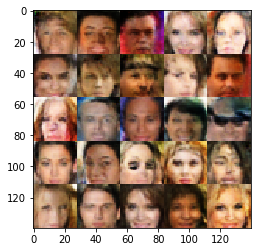

Epochs: 1/1. Discriminator Loss: 0.949 Generator Loss: 0.94
Epochs: 1/1. Discriminator Loss: 1.039 Generator Loss: 1.006
Epochs: 1/1. Discriminator Loss: 0.976 Generator Loss: 0.949
Epochs: 1/1. Discriminator Loss: 1.053 Generator Loss: 0.731
Epochs: 1/1. Discriminator Loss: 1.57 Generator Loss: 0.387
Epochs: 1/1. Discriminator Loss: 1.337 Generator Loss: 0.531
Epochs: 1/1. Discriminator Loss: 1.044 Generator Loss: 1.075
Epochs: 1/1. Discriminator Loss: 0.872 Generator Loss: 1.343
Epochs: 1/1. Discriminator Loss: 0.946 Generator Loss: 1.11
Epochs: 1/1. Discriminator Loss: 1.179 Generator Loss: 0.682


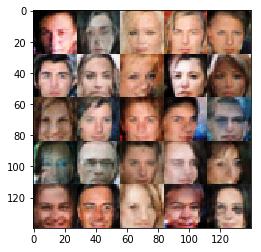

Epochs: 1/1. Discriminator Loss: 0.94 Generator Loss: 0.934
Epochs: 1/1. Discriminator Loss: 1.301 Generator Loss: 0.546
Epochs: 1/1. Discriminator Loss: 0.99 Generator Loss: 0.946
Epochs: 1/1. Discriminator Loss: 1.155 Generator Loss: 0.692
Epochs: 1/1. Discriminator Loss: 1.051 Generator Loss: 1.101
Epochs: 1/1. Discriminator Loss: 1.223 Generator Loss: 0.62
Epochs: 1/1. Discriminator Loss: 0.943 Generator Loss: 1.002
Epochs: 1/1. Discriminator Loss: 1.128 Generator Loss: 0.745
Epochs: 1/1. Discriminator Loss: 1.117 Generator Loss: 1.165
Epochs: 1/1. Discriminator Loss: 1.028 Generator Loss: 0.815


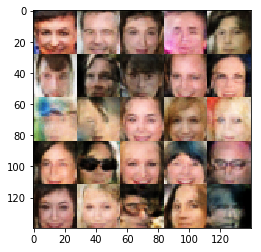

Epochs: 1/1. Discriminator Loss: 0.981 Generator Loss: 0.975
Epochs: 1/1. Discriminator Loss: 1.057 Generator Loss: 0.858
Epochs: 1/1. Discriminator Loss: 1.573 Generator Loss: 0.385
Epochs: 1/1. Discriminator Loss: 1.553 Generator Loss: 0.408
Epochs: 1/1. Discriminator Loss: 0.972 Generator Loss: 1.246
Epochs: 1/1. Discriminator Loss: 1.039 Generator Loss: 0.832
Epochs: 1/1. Discriminator Loss: 1.034 Generator Loss: 0.948
Epochs: 1/1. Discriminator Loss: 1.092 Generator Loss: 0.871
Epochs: 1/1. Discriminator Loss: 1.539 Generator Loss: 0.433
Epochs: 1/1. Discriminator Loss: 1.008 Generator Loss: 1.008


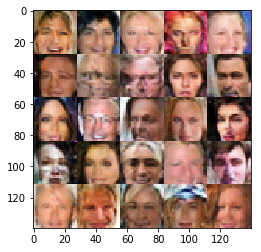

Epochs: 1/1. Discriminator Loss: 1.082 Generator Loss: 0.749
Epochs: 1/1. Discriminator Loss: 1.169 Generator Loss: 0.817
Epochs: 1/1. Discriminator Loss: 0.908 Generator Loss: 1.026
Epochs: 1/1. Discriminator Loss: 1.058 Generator Loss: 1.343
Epochs: 1/1. Discriminator Loss: 1.069 Generator Loss: 0.94
Epochs: 1/1. Discriminator Loss: 1.12 Generator Loss: 0.753
Epochs: 1/1. Discriminator Loss: 0.97 Generator Loss: 1.312
Epochs: 1/1. Discriminator Loss: 1.006 Generator Loss: 1.285
Epochs: 1/1. Discriminator Loss: 1.079 Generator Loss: 1.1
Epochs: 1/1. Discriminator Loss: 1.089 Generator Loss: 0.793


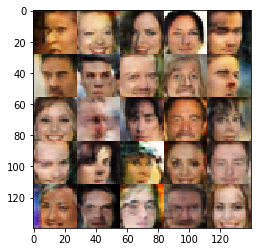

Epochs: 1/1. Discriminator Loss: 0.84 Generator Loss: 1.277
Epochs: 1/1. Discriminator Loss: 1.069 Generator Loss: 0.787
Epochs: 1/1. Discriminator Loss: 1.059 Generator Loss: 0.834
Epochs: 1/1. Discriminator Loss: 1.221 Generator Loss: 0.635
Epochs: 1/1. Discriminator Loss: 0.813 Generator Loss: 1.333
Epochs: 1/1. Discriminator Loss: 1.07 Generator Loss: 1.176
Epochs: 1/1. Discriminator Loss: 1.438 Generator Loss: 0.469
Epochs: 1/1. Discriminator Loss: 0.908 Generator Loss: 1.032
Epochs: 1/1. Discriminator Loss: 1.178 Generator Loss: 0.712
Epochs: 1/1. Discriminator Loss: 1.006 Generator Loss: 1.274


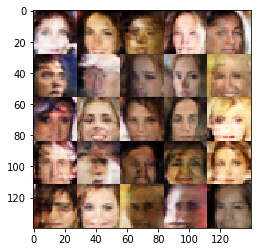

Epochs: 1/1. Discriminator Loss: 1.218 Generator Loss: 0.694
Epochs: 1/1. Discriminator Loss: 1.254 Generator Loss: 0.629
Epochs: 1/1. Discriminator Loss: 1.198 Generator Loss: 0.636
Epochs: 1/1. Discriminator Loss: 1.22 Generator Loss: 0.691
Epochs: 1/1. Discriminator Loss: 1.041 Generator Loss: 1.096
Epochs: 1/1. Discriminator Loss: 0.888 Generator Loss: 0.963
Epochs: 1/1. Discriminator Loss: 1.159 Generator Loss: 0.729
Epochs: 1/1. Discriminator Loss: 1.269 Generator Loss: 0.592
Epochs: 1/1. Discriminator Loss: 1.089 Generator Loss: 0.77
Epochs: 1/1. Discriminator Loss: 1.093 Generator Loss: 0.823


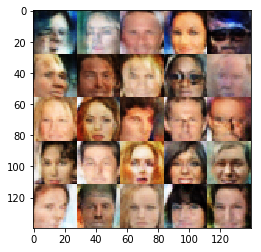

Epochs: 1/1. Discriminator Loss: 1.103 Generator Loss: 0.759
Epochs: 1/1. Discriminator Loss: 0.819 Generator Loss: 1.1
Epochs: 1/1. Discriminator Loss: 0.944 Generator Loss: 1.13
Epochs: 1/1. Discriminator Loss: 1.176 Generator Loss: 0.77
Epochs: 1/1. Discriminator Loss: 1.13 Generator Loss: 0.822
Epochs: 1/1. Discriminator Loss: 1.187 Generator Loss: 0.628
Epochs: 1/1. Discriminator Loss: 1.157 Generator Loss: 0.648
Epochs: 1/1. Discriminator Loss: 1.001 Generator Loss: 0.844
Epochs: 1/1. Discriminator Loss: 1.216 Generator Loss: 0.658
Epochs: 1/1. Discriminator Loss: 1.107 Generator Loss: 0.694


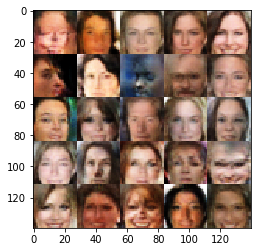

Epochs: 1/1. Discriminator Loss: 1.067 Generator Loss: 1.228
Epochs: 1/1. Discriminator Loss: 0.815 Generator Loss: 1.212
Epochs: 1/1. Discriminator Loss: 0.998 Generator Loss: 0.898
Epochs: 1/1. Discriminator Loss: 1.244 Generator Loss: 0.625
Epochs: 1/1. Discriminator Loss: 1.096 Generator Loss: 0.802
Epochs: 1/1. Discriminator Loss: 1.349 Generator Loss: 0.577
Epochs: 1/1. Discriminator Loss: 1.255 Generator Loss: 0.638
Epochs: 1/1. Discriminator Loss: 1.041 Generator Loss: 0.803
Epochs: 1/1. Discriminator Loss: 0.983 Generator Loss: 0.863
Epochs: 1/1. Discriminator Loss: 1.226 Generator Loss: 0.613


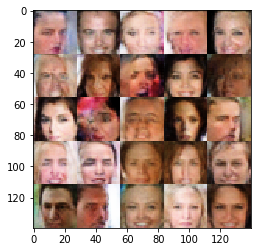

Epochs: 1/1. Discriminator Loss: 1.173 Generator Loss: 0.745
Epochs: 1/1. Discriminator Loss: 1.286 Generator Loss: 0.669
Epochs: 1/1. Discriminator Loss: 1.02 Generator Loss: 0.926
Epochs: 1/1. Discriminator Loss: 0.876 Generator Loss: 1.102
Epochs: 1/1. Discriminator Loss: 1.16 Generator Loss: 0.903
Epochs: 1/1. Discriminator Loss: 1.064 Generator Loss: 0.869
Epochs: 1/1. Discriminator Loss: 0.921 Generator Loss: 1.107
Epochs: 1/1. Discriminator Loss: 0.976 Generator Loss: 1.203
Epochs: 1/1. Discriminator Loss: 1.477 Generator Loss: 0.46
Epochs: 1/1. Discriminator Loss: 1.391 Generator Loss: 0.529


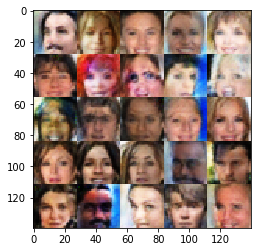

Epochs: 1/1. Discriminator Loss: 0.957 Generator Loss: 1.24
Epochs: 1/1. Discriminator Loss: 0.998 Generator Loss: 0.931
Epochs: 1/1. Discriminator Loss: 0.79 Generator Loss: 1.238
Epochs: 1/1. Discriminator Loss: 1.069 Generator Loss: 0.855
Epochs: 1/1. Discriminator Loss: 1.127 Generator Loss: 0.807
Epochs: 1/1. Discriminator Loss: 0.91 Generator Loss: 1.367
Epochs: 1/1. Discriminator Loss: 1.494 Generator Loss: 0.439
Epochs: 1/1. Discriminator Loss: 1.211 Generator Loss: 0.786
Epochs: 1/1. Discriminator Loss: 1.109 Generator Loss: 0.873
Epochs: 1/1. Discriminator Loss: 1.034 Generator Loss: 0.882


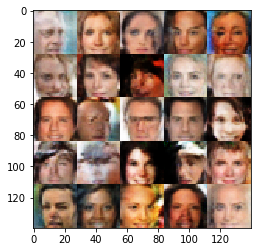

Epochs: 1/1. Discriminator Loss: 1.17 Generator Loss: 0.718
Epochs: 1/1. Discriminator Loss: 1.102 Generator Loss: 0.739
Epochs: 1/1. Discriminator Loss: 1.205 Generator Loss: 0.884
Epochs: 1/1. Discriminator Loss: 0.908 Generator Loss: 1.4
Epochs: 1/1. Discriminator Loss: 1.098 Generator Loss: 0.783
Epochs: 1/1. Discriminator Loss: 1.484 Generator Loss: 0.448
Epochs: 1/1. Discriminator Loss: 0.761 Generator Loss: 1.45
Epochs: 1/1. Discriminator Loss: 1.237 Generator Loss: 0.606
Epochs: 1/1. Discriminator Loss: 0.857 Generator Loss: 1.162
Epochs: 1/1. Discriminator Loss: 1.123 Generator Loss: 0.8


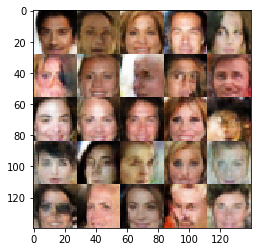

Epochs: 1/1. Discriminator Loss: 0.846 Generator Loss: 1.129
Epochs: 1/1. Discriminator Loss: 1.273 Generator Loss: 0.578
Epochs: 1/1. Discriminator Loss: 1.261 Generator Loss: 0.665
Epochs: 1/1. Discriminator Loss: 1.3 Generator Loss: 0.793
Epochs: 1/1. Discriminator Loss: 1.05 Generator Loss: 1.214
Epochs: 1/1. Discriminator Loss: 1.171 Generator Loss: 1.12
Epochs: 1/1. Discriminator Loss: 0.971 Generator Loss: 0.962
Epochs: 1/1. Discriminator Loss: 1.095 Generator Loss: 0.861
Epochs: 1/1. Discriminator Loss: 1.338 Generator Loss: 0.596
Epochs: 1/1. Discriminator Loss: 1.204 Generator Loss: 0.665


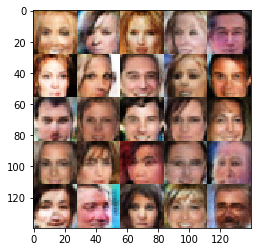

Epochs: 1/1. Discriminator Loss: 1.203 Generator Loss: 0.806
Epochs: 1/1. Discriminator Loss: 1.171 Generator Loss: 0.734
Epochs: 1/1. Discriminator Loss: 0.974 Generator Loss: 1.612
Epochs: 1/1. Discriminator Loss: 0.95 Generator Loss: 0.966
Epochs: 1/1. Discriminator Loss: 1.154 Generator Loss: 0.71
Epochs: 1/1. Discriminator Loss: 1.167 Generator Loss: 0.702
Epochs: 1/1. Discriminator Loss: 1.013 Generator Loss: 0.789
Epochs: 1/1. Discriminator Loss: 1.553 Generator Loss: 0.453
Epochs: 1/1. Discriminator Loss: 1.124 Generator Loss: 0.732
Epochs: 1/1. Discriminator Loss: 0.978 Generator Loss: 1.143


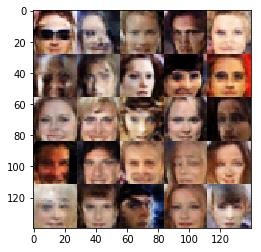

Epochs: 1/1. Discriminator Loss: 1.468 Generator Loss: 0.526
Epochs: 1/1. Discriminator Loss: 1.12 Generator Loss: 0.89
Epochs: 1/1. Discriminator Loss: 0.82 Generator Loss: 1.428
Epochs: 1/1. Discriminator Loss: 1.469 Generator Loss: 0.445
Epochs: 1/1. Discriminator Loss: 0.953 Generator Loss: 0.974
Epochs: 1/1. Discriminator Loss: 0.886 Generator Loss: 1.094
Epochs: 1/1. Discriminator Loss: 1.326 Generator Loss: 0.545
Epochs: 1/1. Discriminator Loss: 1.388 Generator Loss: 0.495
Epochs: 1/1. Discriminator Loss: 1.153 Generator Loss: 0.745
Epochs: 1/1. Discriminator Loss: 0.979 Generator Loss: 1.162


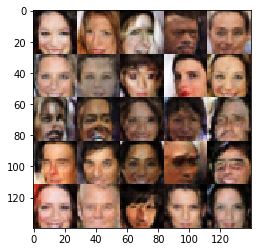

Epochs: 1/1. Discriminator Loss: 1.327 Generator Loss: 0.543
Epochs: 1/1. Discriminator Loss: 1.319 Generator Loss: 0.598
Epochs: 1/1. Discriminator Loss: 1.033 Generator Loss: 0.908
Epochs: 1/1. Discriminator Loss: 0.909 Generator Loss: 1.254
Epochs: 1/1. Discriminator Loss: 1.221 Generator Loss: 0.666
Epochs: 1/1. Discriminator Loss: 1.056 Generator Loss: 0.907
Epochs: 1/1. Discriminator Loss: 1.316 Generator Loss: 0.599
Epochs: 1/1. Discriminator Loss: 1.477 Generator Loss: 0.434
Epochs: 1/1. Discriminator Loss: 1.231 Generator Loss: 0.678
Epochs: 1/1. Discriminator Loss: 1.209 Generator Loss: 0.589


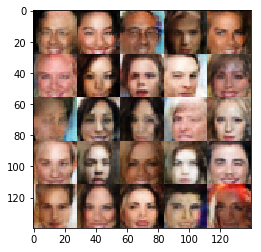

Epochs: 1/1. Discriminator Loss: 0.956 Generator Loss: 1.264
Epochs: 1/1. Discriminator Loss: 0.933 Generator Loss: 1.209
Epochs: 1/1. Discriminator Loss: 0.93 Generator Loss: 1.002
Epochs: 1/1. Discriminator Loss: 0.976 Generator Loss: 0.979
Epochs: 1/1. Discriminator Loss: 1.15 Generator Loss: 0.71
Epochs: 1/1. Discriminator Loss: 1.406 Generator Loss: 0.493
Epochs: 1/1. Discriminator Loss: 0.914 Generator Loss: 0.969
Epochs: 1/1. Discriminator Loss: 1.435 Generator Loss: 0.451
Epochs: 1/1. Discriminator Loss: 0.985 Generator Loss: 0.926
Epochs: 1/1. Discriminator Loss: 1.408 Generator Loss: 0.496


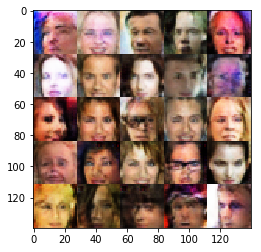

Epochs: 1/1. Discriminator Loss: 0.986 Generator Loss: 0.903
Epochs: 1/1. Discriminator Loss: 1.153 Generator Loss: 0.739
Epochs: 1/1. Discriminator Loss: 0.89 Generator Loss: 0.988
Epochs: 1/1. Discriminator Loss: 1.179 Generator Loss: 0.693
Epochs: 1/1. Discriminator Loss: 1.11 Generator Loss: 0.79
Epochs: 1/1. Discriminator Loss: 1.134 Generator Loss: 0.751
Epochs: 1/1. Discriminator Loss: 0.945 Generator Loss: 1.168
Epochs: 1/1. Discriminator Loss: 1.072 Generator Loss: 0.873
Epochs: 1/1. Discriminator Loss: 0.986 Generator Loss: 0.979
Epochs: 1/1. Discriminator Loss: 1.228 Generator Loss: 0.588


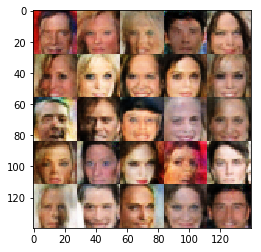

Epochs: 1/1. Discriminator Loss: 0.951 Generator Loss: 0.932
Epochs: 1/1. Discriminator Loss: 1.203 Generator Loss: 0.644
Epochs: 1/1. Discriminator Loss: 1.382 Generator Loss: 0.499
Epochs: 1/1. Discriminator Loss: 1.153 Generator Loss: 0.671
Epochs: 1/1. Discriminator Loss: 1.063 Generator Loss: 0.856
Epochs: 1/1. Discriminator Loss: 1.005 Generator Loss: 0.888
Epochs: 1/1. Discriminator Loss: 1.016 Generator Loss: 1.047
Epochs: 1/1. Discriminator Loss: 1.081 Generator Loss: 0.833
Epochs: 1/1. Discriminator Loss: 1.078 Generator Loss: 0.927
Epochs: 1/1. Discriminator Loss: 1.296 Generator Loss: 0.552


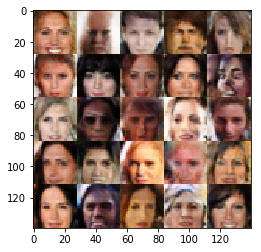

Epochs: 1/1. Discriminator Loss: 1.144 Generator Loss: 0.7
Epochs: 1/1. Discriminator Loss: 1.149 Generator Loss: 0.866
Epochs: 1/1. Discriminator Loss: 0.91 Generator Loss: 1.123
Epochs: 1/1. Discriminator Loss: 1.356 Generator Loss: 0.562
Epochs: 1/1. Discriminator Loss: 1.203 Generator Loss: 0.656
Epochs: 1/1. Discriminator Loss: 1.266 Generator Loss: 0.598
Epochs: 1/1. Discriminator Loss: 1.142 Generator Loss: 0.681
Epochs: 1/1. Discriminator Loss: 1.241 Generator Loss: 0.609
Epochs: 1/1. Discriminator Loss: 1.065 Generator Loss: 0.787
Epochs: 1/1. Discriminator Loss: 1.004 Generator Loss: 1.021


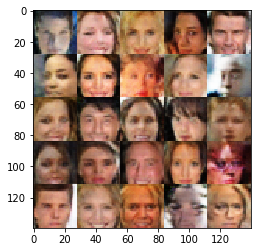

Epochs: 1/1. Discriminator Loss: 1.024 Generator Loss: 0.907
Epochs: 1/1. Discriminator Loss: 1.155 Generator Loss: 0.691
Epochs: 1/1. Discriminator Loss: 0.991 Generator Loss: 1.171
Epochs: 1/1. Discriminator Loss: 1.216 Generator Loss: 0.624
Epochs: 1/1. Discriminator Loss: 1.152 Generator Loss: 0.762
Epochs: 1/1. Discriminator Loss: 1.207 Generator Loss: 1.09
Epochs: 1/1. Discriminator Loss: 0.981 Generator Loss: 0.959
Epochs: 1/1. Discriminator Loss: 1.062 Generator Loss: 0.947
Epochs: 1/1. Discriminator Loss: 1.031 Generator Loss: 0.804
Epochs: 1/1. Discriminator Loss: 1.049 Generator Loss: 0.84


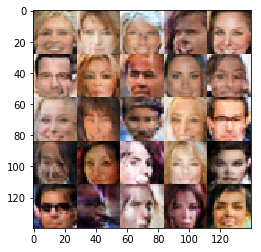

Epochs: 1/1. Discriminator Loss: 1.243 Generator Loss: 0.627
Epochs: 1/1. Discriminator Loss: 1.21 Generator Loss: 0.652
Epochs: 1/1. Discriminator Loss: 0.907 Generator Loss: 1.035
Epochs: 1/1. Discriminator Loss: 0.597 Generator Loss: 2.004
Epochs: 1/1. Discriminator Loss: 1.34 Generator Loss: 0.5
Epochs: 1/1. Discriminator Loss: 1.278 Generator Loss: 0.583
Epochs: 1/1. Discriminator Loss: 1.035 Generator Loss: 0.852
Epochs: 1/1. Discriminator Loss: 1.088 Generator Loss: 0.877
Epochs: 1/1. Discriminator Loss: 0.975 Generator Loss: 0.976
Epochs: 1/1. Discriminator Loss: 1.213 Generator Loss: 0.925


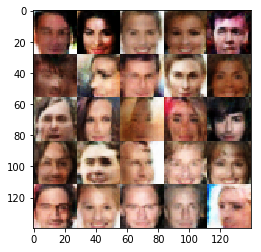

Epochs: 1/1. Discriminator Loss: 0.945 Generator Loss: 0.999
Epochs: 1/1. Discriminator Loss: 1.236 Generator Loss: 0.599
Epochs: 1/1. Discriminator Loss: 1.188 Generator Loss: 0.727
Epochs: 1/1. Discriminator Loss: 1.007 Generator Loss: 0.908
Epochs: 1/1. Discriminator Loss: 0.988 Generator Loss: 0.977
Epochs: 1/1. Discriminator Loss: 1.408 Generator Loss: 0.462
Epochs: 1/1. Discriminator Loss: 1.086 Generator Loss: 0.796
Epochs: 1/1. Discriminator Loss: 1.23 Generator Loss: 0.66
Epochs: 1/1. Discriminator Loss: 1.443 Generator Loss: 0.464
Epochs: 1/1. Discriminator Loss: 1.184 Generator Loss: 0.706


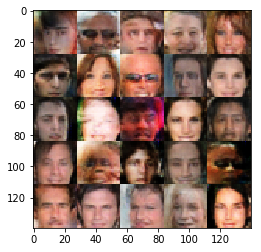

Epochs: 1/1. Discriminator Loss: 1.251 Generator Loss: 0.798
Epochs: 1/1. Discriminator Loss: 0.963 Generator Loss: 1.295
Epochs: 1/1. Discriminator Loss: 1.143 Generator Loss: 0.831
Epochs: 1/1. Discriminator Loss: 0.903 Generator Loss: 1.266
Epochs: 1/1. Discriminator Loss: 0.976 Generator Loss: 1.085
Epochs: 1/1. Discriminator Loss: 1.288 Generator Loss: 0.578


In [14]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.